# Utility functions


In [1]:
%matplotlib inline
from nltk.cluster.kmeans import KMeansClusterer
import nltk
import pickle

import torch
from pytorch_pretrained_bert import BertTokenizer, BertConfig, BertModel
from pytorch_pretrained_bert.modeling import BertPreTrainedModel, BertPreTrainingHeads
import numpy as np
from scipy.spatial.distance import cosine
import pickle
import re
import pandas as pd
device = 'cpu'
import sys
import os
import iso8601
from datetime import datetime

import json
import string

In [2]:
from model_loader import ModelLoader
from text_utils import *
import pickle
from scipy import spatial

In [8]:
def formatTime(tz_time, datetime_object=False):
    isoTime = iso8601.parse_date(tz_time)
    ts = isoTime.timestamp()
    ts = datetime.utcfromtimestamp(ts).strftime("%Y-%m-%d %H:%M:%S:%f")

    if datetime_object:
        ts = datetime.fromisoformat(ts)
    return ts

In [3]:
config_path = '../community_detection/data/bert_config.json'
mind_path = '../community_detection/data/se_minds_new.pkl'
model_path = '../community_detection/data/bert_10epc_se_1e-6_sl40.bin'

model_loader = ModelLoader(config_path, model_path)
model = model_loader.loadModel()

# Parsing Meetings

## Timeline json meeting Input (NA)

In [ ]:
def parsemeeting(text):
    with open(text, 'r') as f:
        parsed_text = json.load(f)
    return parsed_text
text = parsemeeting('../data/timeline_result2.json')

In [ ]:
texts = ''
temp = ' '
for t in text['timeline']['transcriptSegments']:
    temp = ' ' +  t['text']
    texts = texts + temp
    

In [ ]:
## Get top 10 pims instead of all the segments.    
# texts = ''
# temp = ' '
# for t in text['segments']:
#     if t['transcriber'] == "google_speech_api":
#         temp = ' ' +  t['originalText']
#         print ("---text-----  \n\nspoken by: " + t['spokenBy'] + "\n")
#         print (temp, "\n\n\n")
#         texts = texts + temp
    

## Load meeting as csv and get only the top10 pims.

In [4]:
## load it as csv.
import pandas

df = pandas.read_csv('../community_detection/data/ethercast_1.csv', index_col=False, header=0);
df = df.sort_values(by='created_at')

In [9]:
import json
import sys, pickle
sys.path.append('../community_detection/')
import text_preprocessing.preprocess as tp
data= {}
curl_test = {}
segment_contents = {}
texts = ''
curl_test["contextId"] ="6baa3490-69d6-48fc-b5d4-3994e3e8fae0"
curl_test["mindId"] = "01daayheky5f4e02qvrjptftxv"
curl_test["segments"] = []
for index,segment in enumerate(df['value'].tolist()):
    data = json.loads(segment)
    if "google" not in data['transcriber'] and data['originalText']!='':
        print (segment, end=",")
        curl_test['segments'].append(json.loads(segment))
        texts+= (' ' + data['originalText'])
        segment_contents[index]= [' '.join(tp.preprocess(data['originalText'], stop_words=False, remove_punct=False)),formatTime(data['startTime'], True), data['spokenBy']]

{"id": "0399616ea53f4fa7ad42970ed8d78db4", "status": "completed", "deleted": false, "endTime": "2019-07-24T15:59:53Z", "duration": 13, "spokenBy": "8d6db5f7d9b74c54ba38fe710ffcaf3f", "createdAt": "2019-07-24T15:59:53.749758973Z", "deletedAt": null, "startTime": "2019-07-24T15:59:40Z", "updatedAt": "2019-07-24T15:59:55.678182079Z", "confidence": 0.5586346, "recordingId": "7a048eed4c964994a504c5842b141618", "transcriber": "deepgram", "languageCode": "en-US", "originalText": "Yes can't think still senior you sure that's coming.", "transcriptId": "68278dc5-403e-4500-9305-70b78a73faed"},{"id": "ae396e02e5084d9484969032d8b6067c", "status": "completed", "deleted": false, "endTime": "2019-07-24T16:00:02Z", "duration": 4, "spokenBy": "8d6db5f7d9b74c54ba38fe710ffcaf3f", "createdAt": "2019-07-24T16:00:02.265163994Z", "deletedAt": null, "startTime": "2019-07-24T15:59:58Z", "updatedAt": "2019-07-24T16:00:03.560268608Z", "confidence": 0.55431527, "recordingId": "fd23dfc5e9a045678913e773cb93552e", "t

In [10]:
segment_contents

{3: ['Yes cannot think still senior you sure that is coming.',
  datetime.datetime(2019, 7, 24, 15, 59, 40),
  '8d6db5f7d9b74c54ba38fe710ffcaf3f'],
 5: ['Speaking no testing one two three and.',
  datetime.datetime(2019, 7, 24, 15, 59, 58),
  '8d6db5f7d9b74c54ba38fe710ffcaf3f'],
 6: ['Hi awesome hello.',
  datetime.datetime(2019, 7, 24, 16, 0, 2),
  '62b6ae1d7f834b0bb2055f7c72bc3368'],
 7: ['Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch of discussions. Firstly what is the test how we is working on that, but also I thought when use is just go back and forth in accommodation format. There will have some discussions about you ether platform technology choices. What we do where we can improve you know what are some of the problems challenges that we faced coming up to this point cycle. You know how are we doing compared to industry standards or what folks are talking about industry and all that so I just wanted to can keep it i

# get Communities from meetings.

In [12]:
import sys, pickle
sys.path.append('../')
import text_preprocessing.preprocess as tp


mod_texts_unfiltered = tp.preprocess(texts, stop_words=False, remove_punct=False)
mod_texts = []

for index, sent in enumerate(mod_texts_unfiltered):
    if len(sent.split(' '))>250:
        length = len(sent.split(' '))
        split1 = ' '.join([i for i in sent.split(' ')[:round(length/2)]])
        split2 = ' '.join([i for i in sent.split(' ')[round(length/2):]])
        mod_texts.append(split1)
        mod_texts.append(split2)
        continue
        #mod_texts.pop(index)
    if len(sent.split(' '))<=6:
        continue
    mod_texts.append(sent)

print(len(mod_texts))
fv = {}

for index, sent in enumerate(mod_texts):
    #fv[index] = getBERTFeatures(model1, sent, attn_head_idx=-1)
    fv[index] = getBERTFeatures(model, sent, attn_head_idx=-3)
    print (index)

258
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257


In [ ]:
# for index1, sent1 in enumerate(mod_texts):
#     for index2, sent2 in enumerate(mod_texts):
#         print ("Sentence 1:\n " + sent1 + "\nSentence 2:\n " + sent2 + "\n Cosine score:" + str(1-cosine(fv[index1],fv[index2])), end="\n\n\n")

In [13]:
import networkx as nx

def build_graph(doc_list):
    eng_graph = nx.Graph()
    try:
        eng_graph.add_nodes_from(range(len(doc_list)))
    except Exception as e:
        print(e)
    return eng_graph


tg = build_graph(mod_texts)

In [14]:
attn_head_idx = -1

node_edge = []

for index1, sent1 in enumerate(mod_texts):
    print (index1)
    for index2, sent2 in enumerate(mod_texts):
        if index1!=index2 and index2>index1:
            #score = getSentMatchScore_wfeature(sent1, sent2,fv[index1],fv[index2])
            score = getKPBasedSimilarity(sent1, sent2, model , fv[index1], fv[index2], -3)
#             if score > 0.8:
#                 #tg.add_edge(index1,index2,{'weight': score})
#                 tg.add_edge(index1,index2)
            tg.add_edge(index1,index2,weight=score)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257


## build graph using metric threshold. (NA)

In [ ]:
def build_community_graph(tg, mod_texts):
    com_graph = nx.Graph()
    for sent in list(tg.nodes()):
        com_graph.add_node(sent)
    for nodea in tg.nodes():
        for nodeb in tg.nodes():
            if nodea!=nodeb:
                if tg.edges[nodea,nodeb]['weight'] > 0.90:
                    com_graph.add_edge(nodea,nodeb)
    return com_graph
com_graph = build_community_graph(tg, mod_texts)

## build graph using statistical percentage

In [28]:
import math
import community
max_mod = 0
mod_v = 0
for v in [0.15, 0.10, 0.05, 0.01]:
    flag = False
    for count in range(5):   
        temp_nodes = []
        for nodea,nodeb, weight in tg.edges.data():
            temp_nodes.append((nodea,nodeb,weight['weight']))
        temp_nodes = sorted(temp_nodes, key=lambda kv: kv[2], reverse=True)

        temp_nodes = temp_nodes[:math.ceil(len(temp_nodes)*v)+1]

        com_graph = nx.Graph()
        for nodea,nodeb, weight in temp_nodes:
            com_graph.add_edge(nodea,nodeb)

        partition = community.best_partition(com_graph)

        mod = community.modularity(partition, com_graph)
        if mod > max_mod:
            max_mod=mod
            mod_v = v
        print ("The pruning value 'v' and modularity is: ", v, mod)
#         if mod > 0.3:
#             flag=True
#             print ("Modularity reached 3. The pruning value 'v' is: ", v)
#             break
        if mod==0:
            temp_nodes = []
            print ("Modularity reached 0. The pruning value 'v' is: ", 0.15)
            for nodea,nodeb, weight in tg.edges.data():
                temp_nodes.append((nodea,nodeb,weight['weight']))
            temp_nodes = sorted(temp_nodes, key=lambda kv: kv[2], reverse=True)

            temp_nodes = temp_nodes[:math.ceil(len(temp_nodes)*0.15)+1]

            com_graph = nx.Graph()
            for nodea,nodeb, weight in temp_nodes:
                com_graph.add_edge(nodea,nodeb)

            partition = community.best_partition(com_graph)

            mod = community.modularity(partition, com_graph)
            flag=True
            break
    if flag:
        print()
        break

for count in range(5):
    temp_nodes = []
    for nodea,nodeb, weight in tg.edges.data():
        temp_nodes.append((nodea,nodeb,weight['weight']))
    temp_nodes = sorted(temp_nodes, key=lambda kv: kv[2], reverse=True)

    temp_nodes = temp_nodes[:math.ceil(len(temp_nodes)*mod_v)+1]

    com_graph = nx.Graph()
    for nodea,nodeb, weight in temp_nodes:
        com_graph.add_edge(nodea,nodeb)

    partition = community.best_partition(com_graph)
    mod = community.modularity(partition, com_graph)
    if mod>=mod_v:
        break

The pruning value 'v' and modularity is:  0.15 0.12118983733508336
The pruning value 'v' and modularity is:  0.15 0.12291761955089671
The pruning value 'v' and modularity is:  0.15 0.1280388215746409
The pruning value 'v' and modularity is:  0.15 0.12350727603400975
The pruning value 'v' and modularity is:  0.15 0.12821476664582657
The pruning value 'v' and modularity is:  0.1 0.15093180279480392
The pruning value 'v' and modularity is:  0.1 0.14505017910038356
The pruning value 'v' and modularity is:  0.1 0.1442545863940423
The pruning value 'v' and modularity is:  0.1 0.14879714944500294
The pruning value 'v' and modularity is:  0.1 0.1518907221811356
The pruning value 'v' and modularity is:  0.05 0.17691325849359127
The pruning value 'v' and modularity is:  0.05 0.18444719125699738
The pruning value 'v' and modularity is:  0.05 0.1788948875496361
The pruning value 'v' and modularity is:  0.05 0.17589519384103586
The pruning value 'v' and modularity is:  0.05 0.18519784135413497
The 

/home/ray__/.pipenv/bert/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


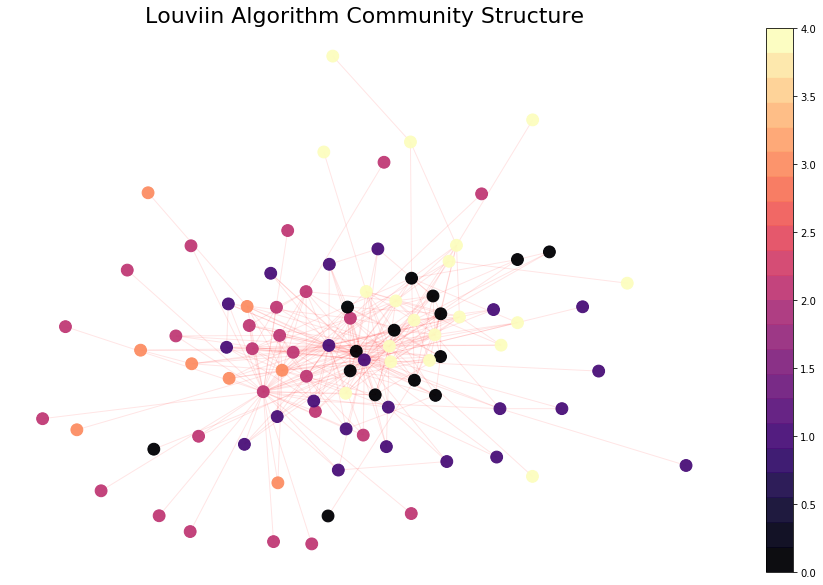

In [29]:
import community
import matplotlib.pyplot as plt
#partition = community.best_partition(com_graph)

values = [partition.get(node) for node in com_graph.nodes()]
values=[partition.get(node) for node in com_graph.nodes()]
plt.rcParams['figure.figsize']= [16, 10]
measure_name = "Louviin Algorithm Community Structure"
pos = nx.spring_layout(com_graph, k=0.2, iterations=20)
nodes_plot=nx.draw_networkx_nodes(com_graph, pos, node_size=140, label=True, cmap=plt.get_cmap('magma', len(com_graph.nodes())/4),node_color=values, alpha=0.95)
edges_plot=nx.draw_networkx_edges(com_graph, pos, edge_color='r', alpha=0.1)
plt.title(measure_name, fontsize=22, fontname='Arial')
plt.colorbar(nodes_plot)
plt.axis('off')
plt.show()

In [30]:
community.modularity(partition, com_graph)

0.279621964306649

In [31]:
partition = sorted(partition.items(), key=lambda kv: kv[1], reverse=False)

In [32]:
current = 0
print ("--------------cluster " + str(0) + "------------ \n ")
for word, cluster in partition:
    if cluster!=current:
        print ("--------------cluster " + str(cluster) + "------------ \n ")
        print (mod_texts[word])
        current=cluster
    else:
        print (mod_texts[word])

--------------cluster 0------------ 
 
Scan of dig to that it because it is a interesting subject right perspective.
Let is talk about the choice of languages right yeah, right forward with.
So that is a different concern there, but from platform benefits.
Now with the closure a really good content gradual typing.
So that is also part the domain driven design.
So this is very small language at its score.
Layer and then you can in the service layer itself.
You the inject implementation asociations of implementation.
So that sort of I iO from the core important parts of system right.
It is easier to paint the relations to things.
So there is useful and they also goes on explicit code right?
So that is why you can create that kind of way.
And you talk to those things through that kind of interface.
The core focus of the program language.
There is a lot more code involved.
--------------cluster 1------------ 
 
Maybe I strong representation or by representation whatever it.
I think is the 

In [15]:
com_graph.number_of_edges()

364

In [16]:
tg.number_of_edges()

7260

# Redefine the resulatant communities 

In [33]:
clusters = []
temp = []
prev_com = 0
for index,(word,cluster) in enumerate(partition):
    if prev_com==cluster:
        temp.append(word)
        #print (temp)
        if index==len(partition)-1:
            clusters.append(temp)
    else:
        clusters.append(temp)
        temp = []
        prev_com = cluster
        temp.append(word)

In [34]:
timerange = []
temp = []
for index, cluster in enumerate(clusters):
    temp= []
    for sent in cluster:
        temp2 = [(sentence,start_time,user) for sentence,start_time,user in segment_contents.values() if mod_texts[sent] in sentence]
        if len(temp2)!=0:
            temp.append(temp2[0])
    if len(temp)!=0:
        temp = sorted(temp,key=lambda kv: kv[1])
        timerange.append(temp)
    else:
        print (cluster)

In [35]:
timerange

[[('Scan of dig to that it because it is a interesting subject right perspective. So fixed Facebook. For example seamlessly I two company right base all developers developers get access to the entire base, you know build the whole thing together deploy so and so forth but they also put in a lot of work to own built i do not have to build everything right? So you can share working piece of the core so they put in a lot of work for it to more right, but as some know okay, obviously for us build are not yet concerned. It is not problem but as we grow the let us say we start to do whole bunch service that do need to have separate the databases on so of level of service and so on and so forth. We still see them that continuing to be a moment or do things that we can and of what right. So I guess.',
   datetime.datetime(2019, 7, 24, 16, 10, 41),
   '8d6db5f7d9b74c54ba38fe710ffcaf3f'),
  ('Shared I sort of on to almost everything but because we use go again the time everything seems to pretty

In [36]:
timerange_detailed = []
temp = []
flag = False
pims = {}
index_pim = 0
index_segment = 0
for index,com in enumerate(timerange):
    temp = []
    flag = False
    #print ("-----community-----", index)
    for (index1,(sent1,time1,user1)), (index2,(sent2,time2,user2)) in zip(enumerate(com[0:]),enumerate(com[1:])):
        if sent1!=sent2:
            #print (time1, time2, (time2-time1).seconds)
            if ((time2-time1).seconds<=120):
                if not flag:
                    pims[index_pim] = {'segment'+str(index_segment):[sent1,time1,user1]}
                    index_segment+=1
                    temp.append((sent1,time1,user1))
                #else:
                    #print ('removing',time1, time2)
                    #temp.pop()
                pims[index_pim]['segment'+str(index_segment)] = [sent2,time2,user2]
                index_segment+=1
                temp.append((sent2,time2,user2))
                flag=True
            else:
                #print (time2, time1)
                if flag==True:
                    index_pim+=1
                    index_segment=0
                flag=False
    if flag==True:
        index_pim+=1
        index_segment=0
    #print ("-----timeRange-----\n", [j for i,j,k in temp])
    timerange_detailed.append(temp)            

## Redefing the resultant communities using different approach (NA)

In [ ]:
timerange = []
temp = []
for index, cluster in enumerate(clusters):
    temp= []
    for sent in cluster:
        temp2 = [(sentence,start_time,user, [index]) for sentence,start_time,user in segment_contents.values() if mod_texts[sent] in sentence]
        if len(temp2)!=0:
            temp.append(temp2[0])
    if len(temp)!=0:
        temp = sorted(temp,key=lambda kv: kv[1])
        timerange.append(temp)
    else:
        print (cluster)

In [ ]:
flattened_timerange = sorted([sent for com in timerange for sent in com], key= lambda kv: kv[1])

In [ ]:
flattened_timerange[29]

In [ ]:
# ft_re = []
# for (index1,sent1), (index2, sent2) in zip(enumerate(flattened_timerange),enumerate(flattened_timerange)):
#     if  sent1[1]==sent2[1]:
#         if len(ft_re)!=0 and ft_re[-1][1] == sent1[1]:
#             temp = []
#             temp.extend([[ft_re[-1][-1], sent1[-1], sent2[-1]]])
#             print (temp)
#             tot_com = list(set(temp))
#             ft_re.pop()
#             ft_re.append((sent1[0],sent1[1],sent1[2],tot_com))
#         else:
#             tot_com = list(set([sent1[-1], sent2[-1]]))
#             ft_re.append((sent1[0],sent1[1],sent1[2],tot_com))
#     else:
#         if ft_re!=[] and ft_re[-1][1] == sent1[1]:
#             tot_com = list(set([ft_re[-1][-1], sent1[-1]]))
#             ft_re.pop()
#             ft_re.append((sent1[0],sent1[1],sent1[2],tot_com))
#         else:
#             ft_re.append(sent1)
            
ft_re = []
tot_com = []
flag=False
for index1, sent1 in enumerate(flattened_timerange):
    if flag==True:
        if index1!=j:
            continue
        else:
            flag=False
    if flag==False:
        for index2, sent2 in enumerate(flattened_timerange):
            if index2>index1:
                if sent1[1]==sent2[1]:
                    if flag==False:
                        tot_com.extend([sent1[-1][-1],sent2[-1][-1]])
                        flag=True
                    else:
                        tot_com.extend([sent2[-1][-1]])
                        if index2==(len(flattened_timerange)-1):
                                tot_com = max(set(tot_com), key = tot_com.count) 
                                ft_re.append((sent1[0],sent1[1],sent1[2],tot_com))
                else:
                    if flag==True:
                        tot_com = max(set(tot_com), key = tot_com.count)
                        ft_re.append((sent1[0],sent1[1],sent1[2],tot_com))
                        j = index2
                    else:
                        ft_re.append(sent1)
                        flag = False
                    tot_com = []
                    break

In [ ]:
ft_re

# Alter communities based on time range and get Keyphrases

In [37]:
from graphrank.graphrank import GraphRank
from graphrank.utils import GraphUtils, TextPreprocess

keyphrase_text = ""
keyphrases_list = []
keyphrases = []
for index_pim in pims.keys():
    keyphrase_text = ""
    for seg in pims[index_pim]:
        if seg != "keyphrase":
            keyphrase_text += (' ' + pims[index_pim][seg][0])
    gr = GraphRank()
    tp = TextPreprocess()
    utils = GraphUtils()

    original_tokens, pos_tuple, filtered_pos_tuple = tp.preprocess_text(keyphrase_text, filter_by_pos=True, pos_filter=['NOUN', 'PROPN', 'ADJ', 'FW'], stop_words=False)

    word_graph = gr.build_word_graph(filtered_pos_tuple, original_tokens=original_tokens, window=4, reset_graph_context=True, preserve_common_words=False)

    keyphrases = gr.get_keyphrases(word_graph, normalize_nodes='degree')
    pims[index_pim]['keyphrase'] = [phrases for phrases, score in keyphrases]

In [38]:

yet_to_combine = []
need_to_remove = []
for index1,i in enumerate(pims.keys()):
    for index2,j in enumerate(pims.keys()):
        if index1!=index2:
            if pims[i]['segment0'][1] >= pims[j]['segment0'][1] and pims[i]['segment0'][1] <= pims[j]['segment'+str(len(pims[j].values())-2)][1]:
                if (j,i) not in yet_to_combine and i not in need_to_remove and j not in need_to_remove:
                    yet_to_combine.append((i,j))
                    need_to_remove.append(i)

In [39]:
for i,j in yet_to_combine:
    for k in pims[i]:
        if k!="keyphrase":
            if pims[i][k] not in pims[j].values():
                pims[j]['segment'+str(len(pims[j].values())-1)] = pims[i][k]
                #print (pims[i][k])
                continue
        else:
            extra_keyphrase = list(set(pims[i]['keyphrase'] + pims[j]['keyphrase']))
            pims[j]['keyphrase']=extra_keyphrase

In [40]:
for i in need_to_remove:
    pims.pop(i)

In [41]:
# meeting start time.
m_time = formatTime("2019-07-24T15:55:00Z", True)
for i in pims.keys():
    print ("\n\n\nPIMs ", i)
    print ("\n\nDiscussion:\n\n ")
    for seg in pims[i]:
        if seg!="keyphrase":
            print ("Minutes from the start of the meeting: ", pims[i][seg][1] - m_time , "\n")
            print (pims[i][seg][1], " ", pims[i][seg][0],"\n")
    print ("Keyphrases:\n\n ", pims[i]['keyphrase'])




PIMs  1


Discussion:

 
Minutes from the start of the meeting:  0:16:58 

2019-07-24 16:11:58   Clarify before that we are not truly a model in the traditional sense as Google as or Facebook case because if you look at it back all of base everything is almost all open source integrations, but everything that is go to their system is in one single april and definitely as we mentioned they have have taken a lot of the done lot of special teams completely focused on improving the productivity developers developers working on main so that is definitely becomes a road at some features for a small complaint like us that we would not want to spend so much time on efforts on those things hooks on the post product now in that sense what so let us try to address with one by one. So what we do we do not have a traditional transfer not all every based in the same. So what we do is we separate the by that concern like by the team points are using it or core group of grouping and the high workin

## testing topic modelling with LDA (NA)

In [ ]:
from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
import string
stop = set(stopwords.words('english'))
exclude = set(string.punctuation) 
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

doc_clean = [clean(doc).split() for doc in new_text]
#doc_clean = [clean(new_text[1]).split()]

In [ ]:
doc_clean

In [ ]:
import gensim
from gensim import corpora
dictionary = corpora.Dictionary(doc_clean)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

In [ ]:
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(doc_term_matrix, num_topics=3, id2word = dictionary, passes=50)

In [ ]:
print(ldamodel.print_topics())

## Testing keyphrase for the timerange (NA)

In [ ]:
pims = {
	"0": {
		"segment0": ["Like my per month to date most likely as we excuse into which we can that be better more consistent but General aw strategy what they say is have one Lambda the internet coming HTML segment notify is attached a general hook for the data uploaded the Lambda function who associate to the S3 bucket and have that pan out all other language like be a dispatcher. Yeah, thats.", "2019-06-28T06:16:58Z", "2982d23c-1e59-476d-88c8-a42376324142", "ebe8604a02c84952bb7ea9dfccd6c1df"]
	},
	"1": {
		"segment0": ["From by will sync up offline first trusting watertight preview will move manually create a bucket in staging environment and try to use it for testing but what I am expecting is not be a big change. What we what we can do is we can we can remove that CD and table itself from the database because the student table and other other things are actually only used for you know, this sets these things so we give you can remove them. So we will now will have a less overhead even in the future. So because after this change we are we are never going to use the stimuli. and.", "2019-06-28T06:11:11Z", "b6db6d45-1a71-41e7-bc16-ae330f655c38", "0ef8d453e7bb41d3bd11153827df076a"]
	},
	"2": {
		"segment0": [
			["All right create an issue. Well track it should be a small thing even in the back end to handle. Yeah, I will see if I can look into it today."], "2019-06-28T05:35:58Z", "b6db6d45-1a71-41e7-bc16-ae330f655c38", "f2d6bb774d5f4649b2e4f15bf07052ad"
		],
		"segment1": [
			["Nothing was done. Headmistress, I would wear black in the public Channel. We need to prompt Channel Minds. Also, I will check with Rashon thundergun. It was another."], "2019-06-28T05:39:19Z", "b6db6d45-1a71-41e7-bc16-ae330f655c38", "418c719a0f5e4888b242df011e818aa3"
		],
		"segment2": [
			["And updated methods for that which I take do too. Okay. Yeah, I will look into that."], "2019-06-28T05:39:35Z", "d65899ed-e47e-4611-8c2c-59b154ff6a3f", "136b9ea1ccaf461facc5e7953a520ff6"
		]
	},
	"3": {
		"segment0": [
			["Its similar than better to go with S3. If GitHub is not giving you just artifact reading scope or something which release artifact reading Scopes even then it can be weird because if we keep tagging or create a good stuff that are not Jesus files are also generated. We need to prevent them from able to downloading do not also even if they do not we have to protect the code right should not be vulnerability this this take that what is the effort to from Reading from your front door if Jacob does give you anything fixed capacity?. ."], "2019-06-28T05:46:56Z", "2982d23c-1e59-476d-88c8-a42376324142", "8c4e8716db754f82b1ed36c449fa15a3"
		],
		"segment1": [
			["Another markers with calibration issue. I will also take a look on the back end. I know that we have to trim the edges to remove the flashin but I do think that if someone puts a empty space between two sentences that can cause an issue. I will just go check. Why is that occurring and see if it is something easy to pick up and then the back end also?."], "2019-06-28T05:50:04Z", "2982d23c-1e59-476d-88c8-a42376324142", "3c74a71652394d65abed891a412c008d"
		]
	},
	"4": {
		"segment0": [
			["You things on whether can we go eat on to Lambda or whether she should whether it should be based on the current key phrase. Maybe we will just take it off way, or I will talk to Sasha Hank and understand and get those details. We did have some plans to move it along."], "2019-06-28T05:57:22Z", "92b4588f-74cc-42f0-bf6d-eec0b6198ade", "6b474e34b42a4514b7689a378bc47c66"
		],
		"segment1": [
			["Between making calls on Tims and waiting on the one that comes last. Yeah that still happen because we will have to wait on the consensus of the what we need to do again is somewhat more on the cause they custom server is not doing anything and then it out into my you are still paying for the execution of the Pim. Lambda looks right at is one thing you can reduce but also the fact that we are right now waiting on Transit segment to complete I think within being the change we will need to wait on transcript second segment to be analyzed. Those are the events that trigger are some regeneration. So if it makes it and because that tramp is segment competed in already in the event of are acting on making this switch to the next most relevant is not a big problem. So it is more even driven so we do not need to wait on okay. Okay. Yeah, and then on the."], "2019-06-28T06:00:48Z", "2982d23c-1e59-476d-88c8-a42376324142", "f5c2855a681c40c8b5a77a85c5c0fd6d"
		],
		"segment2": [
			["Loved it. Thats fine. For now. I think you do. I think once you go to production, we need to figure out a way eventually to not lock sensitive information like transcript segment data Etc. And that will cause some you know issues still doing that. So but ceasing to your fine, too. Yeah."], "2019-06-28T06:02:50Z", "2982d23c-1e59-476d-88c8-a42376324142", "f56de51245ce4fa69c6628e5dc066369"
		],
		"segment3": [
			["Make a contained environment. You cannot specify the requirements separately and then all the executable file separately so that you can put the files as layers. I was just trying to do that, but I could not find it in the process of doing a trigger. If so, why?."], "2019-06-28T06:03:45Z", "f6b27e4a-ad4f-42b3-ac18-e09ec396685b", "4fddeb333fe745cdac8ee41d5785d0ba"
		],
		"segment4": [
			["I think when cat had reduced it to Fighters, I think Sicilian fighter he moved to by Torchlight and side by and all the mines and this one. So overall I think the thing got to do but we ended up using layers so we might be can end up adding both the layers for five dots by touch light and maybe scifi known by all the psychic number like it has layers and learning anything network accessible routes like that, but if sound 50mb."], "2019-06-28T06:06:36Z", "2982d23c-1e59-476d-88c8-a42376324142", "cc29605c0446480f8ace87c4d6593d8a"
		],
		"segment5": [
			["So currently was just working on the refactoring of bug book printing that is done basically it is in like the record reviews review comments have to just address it so apart from the doe those comments look straight forward or should not be a bigger big thing is basically so the other part is the pims part the the pins which are not seen in the mix does not constitute the last last few segments the meeting right? So that issue if started working on it like probably a bit Monday should be able to send the send it for review that code. Okay. Yeah that I maybe I will have to ask like more technical things. I will have to ask like if there is anything which I am missing missing I will call you again."], "2019-06-28T06:08:07Z", "6e8408ce-1072-4209-9e82-945701c7b86c", "439f3d6209184e19a7de54c59a8c4533"
		],
		"segment6": [
			["Make a contained environment. You cannot specify the requirements separately and then all the executable file separately so that you can put the files as layers. I was just trying to do that, but I could not find it in the process of doing a trigger. If so, why?."], "2019-06-28T06:03:45Z", "f6b27e4a-ad4f-42b3-ac18-e09ec396685b", "4fddeb333fe745cdac8ee41d5785d0ba"
		]
	},
	"5": {
		"segment0": ["But we we have done it. We have done it only from our office and I am not confused coming from that one will because people in the calls are like variables XnumberX  scholar two persons called Waterloo. We visited a real scenario kind of thing according a minimum XnumberX people per call because we just need to load test it and because it is normal generous mood worth but under the cave under the load, how does how its behaving that we need to check? Yeah.", "2019-06-28T06:21:56Z", "b6db6d45-1a71-41e7-bc16-ae330f655c38", "b573665bbeae49bdb26020751122dfc1"]
	}
}

In [ ]:
from graphrank.graphrank import GraphRank
from graphrank.utils import GraphUtils, TextPreprocess

keyphrase_text = ""
keyphrases_list = []
keyphrases = []
for index_pim in pims.keys():
    keyphrase_text = ""
    for seg in pims[index_pim]:
        if seg != "keyphrase":
            keyphrase_text += (' ' + ''.join([i for i in pims[index_pim][seg][0]]))
            print (keyphrase_text)
    gr = GraphRank()
    tp = TextPreprocess()
    utils = GraphUtils()

    original_tokens, pos_tuple, filtered_pos_tuple = tp.preprocess_text(keyphrase_text, filter_by_pos=True, pos_filter=['NOUN', 'PROPN', 'ADJ', 'FW'], stop_words=False)

    word_graph = gr.build_word_graph(filtered_pos_tuple, original_tokens=original_tokens, window=4, reset_graph_context=True, preserve_common_words=False)

    keyphrases = gr.get_keyphrases(word_graph, normalize_nodes='degree')
    pims[index_pim]['keyphrase'] = [phrases for phrases, score in keyphrases]

In [ ]:
pims

## keyphrases comparision with word2vec (NA)

In [ ]:
with open("../data/meetings_slack_embeddings.pkl","rb") as f:
    emb = pickle.load(f)

In [ ]:
nodea = 'sql'
nodea_fv = emb[nodea]
closest_match =[]
for nodeb in emb.keys():
    if nodeb!=nodea:
        diff = 1 - cosine(emb[nodeb], nodea_fv)
        closest_match.append((nodeb, diff))
closest_match_sorted = sorted(closest_match, key= lambda kv:kv[1], reverse=True)

In [ ]:
closest_match_sorted[:5]

In [ ]:
import pandas

df = pandas.read_csv('../data/query_resultsync2.csv', index_col=False, header=0);

import json
import sys, pickle
sys.path.append('../')
import text_preprocessing.preprocess as tp
data= {}

segment_contents = {}
texts = ''

for index,segment in enumerate(df['value'].tolist()):
    data = json.loads(segment)
    if "google" not in data['transcriber'] and data['originalText']!='':
    #if "google" not in data['transcriber']:
        texts+= (' ' + data['originalText'])
        segment_contents[index]= [' '.join(tp.preprocess(data['originalText'], stop_words=False, remove_punct=False)),formatTime(data['startTime'], True), data['spokenBy']]
        

In [ ]:
texts

In [ ]:
from graphrank.graphrank import GraphRank
from graphrank.utils import GraphUtils, TextPreprocess

gr = GraphRank()
tp = TextPreprocess()
utils = GraphUtils()

original_tokens, pos_tuple, filtered_pos_tuple = tp.preprocess_text(keyphrase_text, filter_by_pos=True, pos_filter=['NOUN', 'PROPN', 'ADJ', 'FW'], stop_words=False)

word_graph = gr.build_word_graph(filtered_pos_tuple, original_tokens=original_tokens, window=4, reset_graph_context=True, preserve_common_words=False)

#keyphrases = gr.get_keyphrases(word_graph, normalize_nodes='degree')
#pims[index_pim]['keyphrase'] = [phrases for phrases, score in keyphrases]

In [ ]:
com_graph = GraphRank()
nodes_list = []
for indexa, nodea in enumerate(list(word_graph.nodes())):
    for indexb, nodeb in enumerate(list(word_graph.nodes())):
        if indexb>indexa:
            if nodea not in emb.keys() or nodeb not in emb.keys():
                #nodes_list.append((nodea,nodeb,0.5))            
                continue
            nodes_list.append((nodea,nodeb,cosine(emb[nodea],emb[nodeb])))
#print (*nodes_list, sep="\n")
nodes_list_sorted = sorted(nodes_list, key=lambda kv: kv[2], reverse=True)

nodes_list = nodes_list_sorted[:math.ceil(len(nodes_list_sorted)*0.05)+1]

com2_graph = nx.Graph()
for nodea,nodeb, weight in nodes_list:
    com2_graph.add_edge(nodea,nodeb)

partition = community.best_partition(com2_graph)

In [ ]:
community.modularity(partition, com2_graph)

In [ ]:
partition = sorted(partition.items(), key=lambda kv: kv[1], reverse=False)

In [ ]:
current = 0
print ("--------------cluster " + str(0) + "------------ \n ")
for word, cluster in partition:
    if cluster!=current:
        print ("--------------cluster " + str(cluster) + "------------ \n ")
        print (word)
        current=cluster
    else:
        print (word)

## testing ground

In [26]:
text_1 = "We have now created a simple network with Terraform on GCP. You can do a lot more with terraform such as setting up compute instances, firewall rules and much more. I thought this was necessary for the kinds of apps I was working on. And with that in mind, I tried many approaches and frameworks for implementing the same pattern: Single-page applications (SPA). The next thing we shall do is get the necessary credentials from GCP. Go to the GCP console menu and select APIs & Services then Credentials. Now click the Create Credentials button and choose Service Account Key. On the next screen choose Compute Engine default service account and JSON then click Create. This will download a json file to your computer, move this file to the folder where we shall write our terraform code. This file contains sensitive information so do not store it in a public repository or make it public."
text_1 = [sent for sent in text_1.split('. ')]
text_2 = "properly applied HR strategies ensure that  strategic recruiting and retention processes are created that fit the organization.There's a clear need for increased visibility to drastically improve sales. But in order to get more visibility, businesses have to spend more money. When that well runs dry, what are you supposed to do?.  strategically applying smart HR insights into different areas of the business tends to improve employee engagement throughout the company. However, identifying the right strategies to market your business is often likened to rocket science.  Some businesses have been built solely on the backs of social media. How do you get your message to the right audience and do it effectively? How do you boost visibility and increase sales while sustaining a profit with a converting offer? Today, with so much vying for our attention from social media, to search engine optimization, blogging and pay-per-click advertising, it's easy to see why most are ready to pull their hair out.The truth is that what got you to this point in business is likely not going to get you to the next level. If you're feeling stuck, join the fray. Most entrepreneurs are so busy working 'in' their businesses that they fail to work 'on' their businesses. As a result of dealing with the day-to-day operations of a company that includes customer hand-holding, supply-chain demands and more, we often neglect to wield the right marketing strategies that will help fuel our business's growth."
text_2 = [sent for sent in text_2.split('. ')]
print(len(text_1),len(text_2))

10 10


In [ ]:
c_fv = getBERTFeatures(model1,"", attn_head_idx = -1)
c_fv2 = getBERTFeatures(model1, "", attn_head_idx = -1)
#getSentMatchScore_wfeature(c_text, c_text, c_fv, c_fv2, nsp_dampening_factor = 0.7)
1-cosine(c_fv,c_fv2)

In [22]:
label = {}
for x in range(10):
    label[x]="in-domain" 
for x in range(10,20):
    label[x]="out-of-domain" 


In [23]:
label

{0: 'in-domain',
 1: 'in-domain',
 2: 'in-domain',
 3: 'in-domain',
 4: 'in-domain',
 5: 'in-domain',
 6: 'in-domain',
 7: 'in-domain',
 8: 'in-domain',
 9: 'in-domain',
 10: 'out-of-domain',
 11: 'out-of-domain',
 12: 'out-of-domain',
 13: 'out-of-domain',
 14: 'out-of-domain',
 15: 'out-of-domain',
 16: 'out-of-domain',
 17: 'out-of-domain',
 18: 'out-of-domain',
 19: 'out-of-domain'}

In [25]:
for index1, text1 in enumerate(text_1+(text_2)):
    for index2, text2 in enumerate(text_1+(text_2)):
        if index2>index1:
            text1_fv = getBERTFeatures(model1,text1, attn_head_idx = -1)
            text2_fv = getBERTFeatures(model1,text2, attn_head_idx = -1)
            cosine_similarity = 1 - cosine(text1_fv, text2_fv)
            metric_similarity = getSentMatchScore_wfeature(text1, text2, text1_fv, text2_fv, nsp_dampening_factor = 0.7)
            
            print (label[index1] + "  and   " + label[index2] + "   scores: " )
            print ("cosine similarity: " + str(cosine_similarity))
            print ("metric similarity: " + str(metric_similarity))
            print ("\n\n")

/home/ray__/.local/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  


in-domain  and   in-domain   scores: 
cosine similarity: 0.8516662120819092
metric similarity: 0.7758247196674346



in-domain  and   in-domain   scores: 
cosine similarity: 0.7491704821586609
metric similarity: 0.40114160291850565



in-domain  and   in-domain   scores: 
cosine similarity: 0.7735044360160828
metric similarity: 0.3946720206178725



in-domain  and   in-domain   scores: 
cosine similarity: 0.8567399382591248
metric similarity: 0.7779539465904235



in-domain  and   in-domain   scores: 
cosine similarity: 0.8232986330986023
metric similarity: 0.7615301966667175



in-domain  and   in-domain   scores: 
cosine similarity: 0.8089068531990051
metric similarity: 0.44061918258666993



in-domain  and   in-domain   scores: 
cosine similarity: 0.8328424096107483
metric similarity: 0.43739284947514534



in-domain  and   in-domain   scores: 
cosine similarity: 0.8580222129821777
metric similarity: 0.7789958775043487



in-domain  and   in-domain   scores: 
cosine similarity: 0.79

in-domain  and   out-of-domain   scores: 
cosine similarity: 0.8279003500938416
metric similarity: 0.41786148604005574



in-domain  and   in-domain   scores: 
cosine similarity: 0.8381195664405823
metric similarity: 0.7690520644187927



in-domain  and   in-domain   scores: 
cosine similarity: 0.844052255153656
metric similarity: 0.7669600695371628



in-domain  and   in-domain   scores: 
cosine similarity: 0.837698221206665
metric similarity: 0.5546897530555726



in-domain  and   in-domain   scores: 
cosine similarity: 0.8740924000740051
metric similarity: 0.7838314026594162



in-domain  and   in-domain   scores: 
cosine similarity: 0.826452910900116
metric similarity: 0.4442149244248867



in-domain  and   out-of-domain   scores: 
cosine similarity: 0.8424126505851746
metric similarity: 0.42440767474472524



in-domain  and   out-of-domain   scores: 
cosine similarity: 0.7859041690826416
metric similarity: 0.39583168025128546



in-domain  and   out-of-domain   scores: 
cosine sim

in-domain  and   out-of-domain   scores: 
cosine similarity: 0.7177653312683105
metric similarity: 0.3599932650802657



in-domain  and   out-of-domain   scores: 
cosine similarity: 0.6728736162185669
metric similarity: 0.33760689896298574



in-domain  and   out-of-domain   scores: 
cosine similarity: 0.6735038757324219
metric similarity: 0.34440090050920846



in-domain  and   out-of-domain   scores: 
cosine similarity: 0.6763445138931274
metric similarity: 0.2737832929939032



in-domain  and   out-of-domain   scores: 
cosine similarity: 0.7520753145217896
metric similarity: 0.38479555482044814



in-domain  and   out-of-domain   scores: 
cosine similarity: 0.6945918798446655
metric similarity: 0.34989912365563214



in-domain  and   out-of-domain   scores: 
cosine similarity: 0.6559268832206726
metric similarity: 0.3296391125768423



out-of-domain  and   out-of-domain   scores: 
cosine similarity: 0.7887111902236938
metric similarity: 0.7443013131618499



out-of-domain  and   out

In [45]:
## subtopics

topic_1 = "We have now created a simple network with Terraform on GCP. You can do a lot more with terraform such as setting up compute instances, firewall rules and much more. The next thing we shall do is get the necessary credentials from GCP. Go to the GCP console menu and select APIs & Services then Credentials. Now click the Create Credentials button and choose Service Account Key. On the next screen choose Compute Engine default service account and JSON then click Create. This will download a json file to your computer, move this file to the folder where we shall write our terraform code. This file contains sensitive information so do not store it in a public repository or make it public."
topic_1 = [sent for sent in topic_1.split('. ') if sent!=""]
topic_2 = "I thought this was necessary for the kinds of apps I was working on. And with that in mind, I tried many approaches and frameworks for implementing the same pattern: Single-page applications. If you work in the JavaScript ecosystem, you are most likely aware of how difficult it is to manage dependencies.When one of your core libraries releases a major version, it is time to start thinking about upgrading. Imagine that a library named X has a peer dependency on React and you are migrating your application to React. Maintaining an application with a large codebase requires a lot of discipline and having your dependencies up to date should be a top priority for your team and organization. "
topic_2 = [sent for sent in topic_2.split('. ') if sent!=""]
print(len(topic_1),len(topic_2))

8 5


In [46]:
label2 = {}
for x in range(8):
    label2[x]="topic_1" 
for x in range(8,14):
    label2[x]="topic_2" 


In [48]:
for index1, text1 in enumerate(topic_1+(topic_2)):
    for index2, text2 in enumerate(topic_1+(topic_2)):
        if index2>index1:
            text1_fv = getBERTFeatures(model1,text1, attn_head_idx = -1)
            text2_fv = getBERTFeatures(model1,text2, attn_head_idx = -1)
            cosine_similarity = 1 - cosine(text1_fv, text2_fv)
            metric_similarity = getSentMatchScore_wfeature(text1, text2, text1_fv, text2_fv, nsp_dampening_factor = 0.7)
            
            print (label2[index1] + "  and   " + label2[index2] + "   scores: " )
            print ("cosine similarity: " + str(cosine_similarity))
            print ("metric similarity: " + str(metric_similarity))
            print ("\n\n")

topic_1  and   topic_1   scores: 
cosine similarity: 0.8516662120819092
metric similarity: 0.7758247196674346





/home/ray__/.local/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  


topic_1  and   topic_1   scores: 
cosine similarity: 0.8567399382591248
metric similarity: 0.7779539465904235



topic_1  and   topic_1   scores: 
cosine similarity: 0.8232986330986023
metric similarity: 0.7615301966667175



topic_1  and   topic_1   scores: 
cosine similarity: 0.8089068531990051
metric similarity: 0.44061918258666993



topic_1  and   topic_1   scores: 
cosine similarity: 0.8328424096107483
metric similarity: 0.43739284947514534



topic_1  and   topic_1   scores: 
cosine similarity: 0.8578987717628479
metric similarity: 0.7789324045181274



topic_1  and   topic_1   scores: 
cosine similarity: 0.7941072583198547
metric similarity: 0.40259689558297396



topic_1  and   topic_2   scores: 
cosine similarity: 0.7491704821586609
metric similarity: 0.40114160291850565



topic_1  and   topic_2   scores: 
cosine similarity: 0.7975009679794312
metric similarity: 0.40541905323043465



topic_1  and   topic_2   scores: 
cosine similarity: 0.736020028591156
metric similarity: 0

topic_2  and   topic_2   scores: 
cosine similarity: 0.8004984855651855
metric similarity: 0.5088323667645455



topic_2  and   topic_2   scores: 
cosine similarity: 0.8155325055122375
metric similarity: 0.7563111335039139



topic_2  and   topic_2   scores: 
cosine similarity: 0.8309771418571472
metric similarity: 0.7654800593852997



topic_2  and   topic_2   scores: 
cosine similarity: 0.824439287185669
metric similarity: 0.727815756201744





# similarity comparison

In [60]:
sa = []
for edgea, edgeb, weight in tg.edges.data():
    #print ("Text A: ")
    #print (mod_texts[edgea])
    #print ("\n\nText b: ")
    #print (mod_texts[edgeb])
    #print ("\n\nsimilarity score:", weight['weight'])
    #print ("\n\n\n")
    sa.append((edgea, edgeb, weight['weight']))

In [61]:
sa_sorted = sorted(sa, key=lambda kv: kv[2], reverse=True)

In [62]:
for edgea, edgeb, weight in sa_sorted[:10]:
    print ("Text A: ")
    print (mod_texts[edgea], edgea)
    print ("\n\nText b: ")
    print (mod_texts[edgeb], edgeb)
    print ("\n\nsimilarity score:", weight)
    print ("\n\n\n")

Text A: 
Scan of dig to that it because it is a interesting subject right perspective. 36


Text b: 
Maybe I strong representation or by representation whatever it. 94


similarity score: 0.9079831838607788




Text A: 
Scan of dig to that it because it is a interesting subject right perspective. 36


Text b: 
I think is the only something course and solution. 241


similarity score: 0.9031273126602173




Text A: 
What it needs to the status are the business requirements. 89


Text b: 
Still evolving so those who want directly it on the browser definitely will have something right it is evolving its it is going and the authentication mechanism is are very opportunity. 236


similarity score: 0.9026549458503723




Text A: 
See you but this but when you do and just long you want the log and define sort things like watch service method you it. 81


Text b: 
I have an architecture call from language what about things like you know communication into service process communication right. 2

In [57]:
print (mod_texts[207])

So that you increase a usability of the code all is three times like interfaces revenue this remote part which we do now use a lot of effect we do now use a lot of to but when started we to so that is not like the biggest thing but was definitely going to yes not having to do corpus collection management not having to to yeah, the Java selection speed staging path and still less to this day never had a problem with asuming it I we are all the changes.


In [48]:
for edgea, edgeb, weight in tg.edges.data():
    print ("Text A: ")
    print (mod_texts[edgea])
    print ("\n\nText b: ")
    print (mod_texts[edgeb])
    print ("\n\nsimilarity score:", weight['weight'])
    print ("\n\n\n")

Text A: 
Yes cannot think still senior you sure that is coming.


Text b: 
Speaking no testing one two three and.


similarity score: 0.0




Text A: 
Yes cannot think still senior you sure that is coming.


Text b: 
Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch of discussions.


similarity score: 0.0




Text A: 
Yes cannot think still senior you sure that is coming.


Text b: 
Firstly what is the test how we is working on that, but also I thought when use is just go back and forth in accommodation format.


similarity score: 0.0




Text A: 
Yes cannot think still senior you sure that is coming.


Text b: 
There will have some discussions about you ether platform technology choices.


similarity score: 0.0




Text A: 
Yes cannot think still senior you sure that is coming.


Text b: 
What we do where we can improve you know what are some of the problems challenges that we faced coming up to this point cycle.


similarity 

It is like they go from the index and they try to go to the graph and directory and.


similarity score: 0.0




Text A: 
Speaking no testing one two three and.


Text b: 
Go through the three and they try to resolve up it.


similarity score: 0.0




Text A: 
Speaking no testing one two three and.


Text b: 
So right now it is pretty fast at least from the front end point it is not go.


similarity score: 0.0




Text A: 
Speaking no testing one two three and.


Text b: 
Now this is where for the platforms has been a pretty good thing with one of the good productions go with going with the language here was good because go perspective of the size of the code base the time does not generally beyond five seconds for us and we have seen case studies and experience supports by different companies around their experiences writing large managing large base of code goal and how has been placing parts to them so for and concern but definitely something that will come into to column CEO steps 

See you but this but when you do and just long you want the log and define sort things like watch service method you it.


similarity score: 0.0




Text A: 
Speaking no testing one two three and.


Text b: 
What are the input that you define how much time did take to perform just operating at the service layer not involving the time to transfer to the network or doing anything like that.


similarity score: 0.0




Text A: 
Speaking no testing one two three and.


Text b: 
So you have a mid very symbol right?


similarity score: 0.0




Text A: 
Speaking no testing one two three and.


Text b: 
So we want to push metrics business metrics or not is not the respect to end points.


similarity score: 0.0




Text A: 
Speaking no testing one two three and.


Text b: 
But this is metrics do you want to do some logging maybe be some so of several that it is where you put it.


similarity score: 0.0




Text A: 
Speaking no testing one two three and.


Text b: 
But you can have some user tha

similarity score: 0.6855969429016113




Text A: 
Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch of discussions.


Text b: 
So those are all IO completely non ios based decisions that a system should be doing those are like business operations lot of can put them and.


similarity score: 0.7609381079673767




Text A: 
Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch of discussions.


Text b: 
So you have a meeting package as we have transcript like that.


similarity score: 0.7645142873128256




Text A: 
Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch of discussions.


Text b: 
So that sort of I iO from the core important parts of system right.


similarity score: 0.7898818651835123




Text A: 
Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch o

similarity score: 0.7437902092933655




Text A: 
Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch of discussions.


Text b: 
Basically next spring or where you use the like you use dependency injection to solve the dependency version and most of it was this random time dependency and spring is basically branded independently injection framework.


similarity score: 0.7107619245847067




Text A: 
Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch of discussions.


Text b: 
So a lot of times I have seen there is a lot of complexity.


similarity score: 0.752016007900238




Text A: 
Give hope I channel Okay right okay so topic what I thought we will do is I just wanted to have like a bunch of discussions.


Text b: 
I just how systems away and most of the time in go you just start provider it in the main you do not have to do a lot of the.


similarity score: 0.77008491



similarity score: 0.7516713937123617




Text A: 
Firstly what is the test how we is working on that, but also I thought when use is just go back and forth in accommodation format.


Text b: 
Publish eight is outside yeah, but we at that point given the know the makes easy for people to just item so sixteen about that.


similarity score: 0.5657903254032135




Text A: 
Firstly what is the test how we is working on that, but also I thought when use is just go back and forth in accommodation format.


Text b: 
Still evolving so those who want directly it on the browser definitely will have something right it is evolving its it is going and the authentication mechanism is are very opportunity.


similarity score: 0.6850333015124003




Text A: 
Firstly what is the test how we is working on that, but also I thought when use is just go back and forth in accommodation format.


Text b: 
It will also improve but basically essentially we can even use certificates and create roles in scope a

similarity score: 0.7536394000053406




Text A: 
There will have some discussions about you ether platform technology choices.


Text b: 
So most of the time once point and that when we were dealing with managing you model we almost never want to touch any database query because we did not know what the permissions were across the work right because directly call from the controller and just who join slack right and you would to know what is break at any point in time.


similarity score: 0.6325240929921468




Text A: 
There will have some discussions about you ether platform technology choices.


Text b: 
So the problem was be able to handle code that changes is so frequently that code that pro so quickly developers code be able to make a progress in the same manner as we used to and at a level in a of company that we were where we about at least whether the use case was defined or not we knew that he wanted to build a platform around a round and registry initially.


similarity sco

They would not keep talking about it month like for so let me start with maybe just at high level right so architecture choices.


similarity score: 0.7825129429499308




Text A: 
What we do where we can improve you know what are some of the problems challenges that we faced coming up to this point cycle.


Text b: 
You know, I know we started off from literally from brand sheet of paper.


similarity score: 0.7558613419532776




Text A: 
What we do where we can improve you know what are some of the problems challenges that we faced coming up to this point cycle.


Text b: 
You know they we said we built this using a variety of different technologies can gone that traditionally Commerce more that three based for example and Java based my chris.


similarity score: 0.7534068822860718




Text A: 
What we do where we can improve you know what are some of the problems challenges that we faced coming up to this point cycle.


Text b: 
And and more more tell Amazon for example, we how wen

similarity score: 0.7245051463445028




Text A: 
What we do where we can improve you know what are some of the problems challenges that we faced coming up to this point cycle.


Text b: 
So you can share working piece of the core so they put in a lot of work for it to more right, but as some know okay, obviously for us build are not yet concerned.


similarity score: 0.7063161730766296




Text A: 
What we do where we can improve you know what are some of the problems challenges that we faced coming up to this point cycle.


Text b: 
It is not problem but as we grow the let us say we start to do whole bunch service that do need to have separate the databases on so of level of service and so on and so forth.


similarity score: 0.7756752570470175




Text A: 
What we do where we can improve you know what are some of the problems challenges that we faced coming up to this point cycle.


Text b: 
We still see them that continuing to be a moment or do things that we can and of what right.



Text b: 
So that is why you can create that kind of way.


similarity score: 0.731195330619812




Text A: 
You know how are we doing compared to industry standards or what folks are talking about industry and all that so I just wanted to can keep it interactive.


Text b: 
And you talk to those things through that kind of interface.


similarity score: 0.811852216720581




Text A: 
You know how are we doing compared to industry standards or what folks are talking about industry and all that so I just wanted to can keep it interactive.


Text b: 
So can just when you wiring your service or application.


similarity score: 0.7708525657653809




Text A: 
You know how are we doing compared to industry standards or what folks are talking about industry and all that so I just wanted to can keep it interactive.


Text b: 
We can just initiate a different implementation with call repository pattern.


similarity score: 0.7890152931213379




Text A: 
You know how are we doing compared to 

Text b: 
Well will we talked to lower and zero or one different.


similarity score: 0.0




Text A: 
You know how are we doing compared to industry standards or what folks are talking about industry and all that so I just wanted to can keep it interactive.


Text b: 
So so he try to buy different systems based and me from what environments.


similarity score: 0.7978934347629547




Text A: 
You know how are we doing compared to industry standards or what folks are talking about industry and all that so I just wanted to can keep it interactive.


Text b: 
It is important to move systems around to pay to the bottom case much as possible.


similarity score: 0.7652590274810791




Text A: 
You know how are we doing compared to industry standards or what folks are talking about industry and all that so I just wanted to can keep it interactive.


Text b: 
So that they are more reusable but sometimes it is not possible.


similarity score: 0.0




Text A: 
You know how are we doing compare

They would not keep talking about it month like for so let me start with maybe just at high level right so architecture choices.


Text b: 
Then you should use a channel clas and you should do the parent clas cetera and that sometimes is not easily available.


similarity score: 0.7781989872455597




Text A: 
They would not keep talking about it month like for so let me start with maybe just at high level right so architecture choices.


Text b: 
The clarify using composition over intelligence is very useful and the way goal does to is pretty nice that is very interesting the old font the language and does not have more than keywords.


similarity score: 0.7555140852928162




Text A: 
They would not keep talking about it month like for so let me start with maybe just at high level right so architecture choices.


Text b: 
So this is very small language at its score.


similarity score: 0.8085520267486572




Text A: 
They would not keep talking about it month like for so let me start

similarity score: 0.8117775917053223




Text A: 
They would not keep talking about it month like for so let me start with maybe just at high level right so architecture choices.


Text b: 
Moving text around when you moving to lot data the like Google definitely and Google does not have.


similarity score: 0.7900749246279398




Text A: 
They would not keep talking about it month like for so let me start with maybe just at high level right so architecture choices.


Text b: 
So there is a lot of chatter chase chatter that goes on between systems to give you the end result so definitely that that is one of that is probably the only reason entty use protocol offers efficient because are like compute cycles it is overall and but generally text is good enough from scale or even general companies.


similarity score: 0.647556742032369




Text A: 
They would not keep talking about it month like for so let me start with maybe just at high level right so architecture choices.


Text b: 
I h

Text A: 
You know they we said we built this using a variety of different technologies can gone that traditionally Commerce more that three based for example and Java based my chris.


Text b: 
It is like they go from the index and they try to go to the graph and directory and.


similarity score: 0.7666004697481791




Text A: 
You know they we said we built this using a variety of different technologies can gone that traditionally Commerce more that three based for example and Java based my chris.


Text b: 
Go through the three and they try to resolve up it.


similarity score: 0.0




Text A: 
You know they we said we built this using a variety of different technologies can gone that traditionally Commerce more that three based for example and Java based my chris.


Text b: 
So right now it is pretty fast at least from the front end point it is not go.


similarity score: 0.7194015185038248




Text A: 
You know they we said we built this using a variety of different technologies c

similarity score: 0.7565936048825582




Text A: 
You know they we said we built this using a variety of different technologies can gone that traditionally Commerce more that three based for example and Java based my chris.


Text b: 
It is important to move systems around to pay to the bottom case much as possible.


similarity score: 0.7188450296719869




Text A: 
You know they we said we built this using a variety of different technologies can gone that traditionally Commerce more that three based for example and Java based my chris.


Text b: 
So that they are more reusable but sometimes it is not possible.


similarity score: 0.0




Text A: 
You know they we said we built this using a variety of different technologies can gone that traditionally Commerce more that three based for example and Java based my chris.


Text b: 
So to give an example, there are far system where in our company that want to build the platform right our core l related services are t zero and they to oper



similarity score: 0.7305431167284647




Text A: 
And and more more tell Amazon for example, we how went the part of you know either not just going a tomorrow at the same time not going with a full services architecture and also going as well dont core main choice with back.


Text b: 
Now let me talk about little little bit about why rejected few of them but the biggest important part was when we started the bill.


similarity score: 0.6609163880348206




Text A: 
And and more more tell Amazon for example, we how went the part of you know either not just going a tomorrow at the same time not going with a full services architecture and also going as well dont core main choice with back.


Text b: 
It is important for us to maintain a velocity that we have this worry about operational warehouse supporting the platform that supports the language.


similarity score: 0.6946360270182291




Text A: 
And and more more tell Amazon for example, we how went the part of you know either not j

There is something that I be very was do not come a framework frameworks like Ruby or something that is too allows some invoices from kind of practices upon the developer and sort of expects the about the right code such that will only work well written in that order and to word away from the same words, you know specific in a workings and things will kind of make you words from the community around view also right.


similarity score: 0.6734592517217001




Text A: 
Let is talk about the decision around that they we wanted to go with model this services or why we went to something in green.


Text b: 
So especially when we work then like one of model and rails backend group on one of the biggest problems are things like handling database connections across different regions.


similarity score: 0.7961073915163676




Text A: 
Let is talk about the decision around that they we wanted to go with model this services or why we went to something in green.


Text b: 
You know using the appr

similarity score: 0.7586376468340555




Text A: 
Let is talk about the decision around that they we wanted to go with model this services or why we went to something in green.


Text b: 
It basically runs a simple from the main main file for that specific base and try see that files or not at least that right now seems to be working but definitely and because lot of the code.


similarity score: 0.7683968544006348




Text A: 
Let is talk about the decision around that they we wanted to go with model this services or why we went to something in green.


Text b: 
Shared I sort of on to almost everything but because we use go again the time everything seems to pretty pas so the test cases they are all run family so they do work but definitely if you look at in terms of size the code base there are two of big concerns with smaller post right one is size of the code base and growing test cases and time it takes so execute so many current across the code base.


similarity score: 0.7072193

similarity score: 0.6848714152971903




Text A: 
Yes, it good point to start because that master that the language that you choose hmmm from you know from I mean most of this is come from experiences both working at living to where we working on a model and moving to Groupon, which was a heavy presented company a with a huge model in between so some of the learning that we took from that was before getting into model the micro services.


Text b: 
So you do not have to worry.


similarity score: 0.0




Text A: 
Yes, it good point to start because that master that the language that you choose hmmm from you know from I mean most of this is come from experiences both working at living to where we working on a model and moving to Groupon, which was a heavy presented company a with a huge model in between so some of the learning that we took from that was before getting into model the micro services.


Text b: 
So in a way you can say the marker for good software is by how many lines of c

similarity score: 0.655810534954071




Text A: 
Yes, it good point to start because that master that the language that you choose hmmm from you know from I mean most of this is come from experiences both working at living to where we working on a model and moving to Groupon, which was a heavy presented company a with a huge model in between so some of the learning that we took from that was before getting into model the micro services.


Text b: 
So they months road media processing guys an understanding program language conference with I was one concern.


similarity score: 0.6612510879834493




Text A: 
Yes, it good point to start because that master that the language that you choose hmmm from you know from I mean most of this is come from experiences both working at living to where we working on a model and moving to Groupon, which was a heavy presented company a with a huge model in between so some of the learning that we took from that was before getting into model the micro ser



similarity score: 0.6914398272832235




Text A: 
There is something that I be very was do not come a framework frameworks like Ruby or something that is too allows some invoices from kind of practices upon the developer and sort of expects the about the right code such that will only work well written in that order and to word away from the same words, you know specific in a workings and things will kind of make you words from the community around view also right.


Text b: 
What would be interesting is to create a small server system that would just subscribe all the topics and lax and you create an event log that one can just read from and you will create like it is on use the data for whatever you it needs to do like creating state back in case of.


similarity score: 0.7855530182520548




Text A: 
There is something that I be very was do not come a framework frameworks like Ruby or something that is too allows some invoices from kind of practices upon the developer and sort of 

So especially when we work then like one of model and rails backend group on one of the biggest problems are things like handling database connections across different regions.


Text b: 
So what we do is we separate the by that concern like by the team points are using it or core group of grouping and the high working up who users it and for what corpus so the front end has a own report but the front end related stuff which is for the mid use case I will not save for everything that we will eventually put some share how are the minor push it elsewhere, but we see that enough work that can use across up use cases for the core platform which completely in goal line at least ninety two right nine percent of it is in goal line that and platform related a P are all in a moral because the entire platform team, which is currently than five people need to maintain in all of that stuff.


similarity score: 0.7334585388501486




Text A: 
So especially when we work then like one of model and ra

Text b: 
And you talk to those things through that kind of interface.


similarity score: 0.7563276290893555




Text A: 
You know using the appropriate data connection database connection or you only your master et cetera and you have to do a lot of to get that in where we go in have had to had chosen the right form of abstraction and design patterns that are put in place and will allow us to easily move with logic or handle much well the second thing was at least some other framework.


Text b: 
So can just when you wiring your service or application.


similarity score: 0.7213336825370789




Text A: 
You know using the appropriate data connection database connection or you only your master et cetera and you have to do a lot of to get that in where we go in have had to had chosen the right form of abstraction and design patterns that are put in place and will allow us to easily move with logic or handle much well the second thing was at least some other framework.


Text b: 
We can 

Text b: 
Now because there there can be sometimes dependency that client is is support, but we just will not be able to figure how to bring this now right?


similarity score: 0.7478543917338053




Text A: 
You know using the appropriate data connection database connection or you only your master et cetera and you have to do a lot of to get that in where we go in have had to had chosen the right form of abstraction and design patterns that are put in place and will allow us to easily move with logic or handle much well the second thing was at least some other framework.


Text b: 
So one thing that is important is figure out okay what entty should be isolated from what we are the entties and what were like higher level entties high deposit that need to talk to lower levels systems there to common an operation.


similarity score: 0.5617718895276388




Text A: 
You know using the appropriate data connection database connection or you only your master et cetera and you have to do a lot



Text b: 
So how quickly you get integrate through now definitely one thing I miss about what things like with the process with closure was an development you try to think of process you come up with the thought process you try to implement it just dynamically see if it works and you written the core is copied it and done so that kind of provided in the evaluation strategy and think the process solving problem is not still something that go application still not to so that is something I do definitely miss and alert seen that.


similarity score: 0.8019335865974426




Text A: 
I want say all the same the same way from my experience where you form you to an five kind of pattern model will be controller with the problem as a controller at least there was no strict guidelines on how the database interactions should be done and what are the business how do we update the some database functions from business logic concerns.


Text b: 
We will write to do you have?


similarity score: 0.0


Text A: 
I want say all the same the same way from my experience where you form you to an five kind of pattern model will be controller with the problem as a controller at least there was no strict guidelines on how the database interactions should be done and what are the business how do we update the some database functions from business logic concerns.


Text b: 
So for above three is just released and they are working on four and they trying to improve the productive of how you define this thoughts so it is worth waiting and seeing how the thing was commit you need a lot more.


similarity score: 0.7620763977368673




Text A: 
I want say all the same the same way from my experience where you form you to an five kind of pattern model will be controller with the problem as a controller at least there was no strict guidelines on how the database interactions should be done and what are the business how do we update the some database functions from business logic concerns.


Text b: 


So right now it is pretty fast at least from the front end point it is not go.


similarity score: 0.7200967669487




Text A: 
So the problem was be able to handle code that changes is so frequently that code that pro so quickly developers code be able to make a progress in the same manner as we used to and at a level in a of company that we were where we about at least whether the use case was defined or not we knew that he wanted to build a platform around a round and registry initially.


Text b: 
Now this is where for the platforms has been a pretty good thing with one of the good productions go with going with the language here was good because go perspective of the size of the code base the time does not generally beyond five seconds for us and we have seen case studies and experience supports by different companies around their experiences writing large managing large base of code goal and how has been placing parts to them so for and concern but definitely something that will 

See you but this but when you do and just long you want the log and define sort things like watch service method you it.


similarity score: 0.7802057464917501




Text A: 
So the problem was be able to handle code that changes is so frequently that code that pro so quickly developers code be able to make a progress in the same manner as we used to and at a level in a of company that we were where we about at least whether the use case was defined or not we knew that he wanted to build a platform around a round and registry initially.


Text b: 
What are the input that you define how much time did take to perform just operating at the service layer not involving the time to transfer to the network or doing anything like that.


similarity score: 0.7075111071268717




Text A: 
So the problem was be able to handle code that changes is so frequently that code that pro so quickly developers code be able to make a progress in the same manner as we used to and at a level in a of company tha

So we knew that we need some things flexible enough to work for different cases and definitely commit to a framework a sort of I guess load on the progress as we once get started.


Text b: 
So we try to create that kind of boundary so that anyone opening on that if you want to build that is use case it just clarity high level service that why is systems together or a group of one tier two services that why I talked to different services in a different manner, but end up reducing most of the components right so to be able to do that you will define out team what are the roles in the responsibilities of a context is quarter and how it from perspective how does it from a indian.


similarity score: 0.6376250187555949




Text A: 
So we knew that we need some things flexible enough to work for different cases and definitely commit to a framework a sort of I guess load on the progress as we once get started.


Text b: 
So you try to Pakistan in its small folder including how it interact wi



similarity score: 0.7007347146670023




Text A: 
So we knew that we need some things flexible enough to work for different cases and definitely commit to a framework a sort of I guess load on the progress as we once get started.


Text b: 
I try to evaluate and I look that language is super Awhile Java and bit closure also which sort of real cloud and upload that go and link out to some extent.


similarity score: 0.7031397422154745




Text A: 
So we knew that we need some things flexible enough to work for different cases and definitely commit to a framework a sort of I guess load on the progress as we once get started.


Text b: 
Now let me talk about little little bit about why rejected few of them but the biggest important part was when we started the bill.


similarity score: 0.6274935404459635




Text A: 
So we knew that we need some things flexible enough to work for different cases and definitely commit to a framework a sort of I guess load on the progress as we once get s

So what is more important for us was not to use screen, but also to use interfaces like gateways are around different parts of the system where it can easily log in way or swap and swap our implementation and is easily move forward quickly like that was the more important and that is one of the fundamentals of for disclose the.


Text b: 
Hours a very simple in nature yeah, Okay, especially the ones that lines concern like a big comment application where you need to pull data from high different services you know, quite the long them and all that and we get them and change them all definitely i mean there is not a lot of.


similarity score: 0.7761423190434774




Text A: 
So what is more important for us was not to use screen, but also to use interfaces like gateways are around different parts of the system where it can easily log in way or swap and swap our implementation and is easily move forward quickly like that was the more important and that is one of the fundamentals of for di

So the clean architecture domain design essentially the idea behind that is the philosophy that you have domain experts in know really well about how systems work especially any commerce platform.


similarity score: 0.6707315146923065




Text A: 
Saying that the fundamentals in how you approach different these right as of concern.


Text b: 
Youre have in monthly products in inventory units et cetera around those jargon should be introduced in the system and we use the way it meant to be used like in a traditional supply same.


similarity score: 0.7091455459594727




Text A: 
Saying that the fundamentals in how you approach different these right as of concern.


Text b: 
So you have to domain person or something about just mean you have developers developers who can write code.


similarity score: 0.0




Text A: 
Saying that the fundamentals in how you approach different these right as of concern.


Text b: 
So it was to bring that knowledge on developers or to sort reach that gap

Text A: 
So database need to be separated to its own layer.


Text b: 
So to give an example, list like at least in the ruby, you would have a forward all models right and you put the meeting entty put the transcription entty you put like contextual core object like an entty detail into the same folder essentially and by doing so what is happening is within that photo people do not try to create tight between those entties.


similarity score: 0.7074515223503113




Text A: 
So database need to be separated to its own layer.


Text b: 
This is really the is this one and there.


similarity score: 0.0




Text A: 
So database need to be separated to its own layer.


Text b: 
It is easier to paint the relations to things.


similarity score: 0.8099631071090698




Text A: 
So database need to be separated to its own layer.


Text b: 
So once you do because seems hard to break the system.


similarity score: 0.7840927243232727




Text A: 
So database need to be separated to its own layer

Text A: 
So database need to be separated to its own layer.


Text b: 
It is very similar to see like emergency systems language, but it also has really good standard libraries for C T p for H C D B and our task and I could just go into the library and just look at the chronic and and what has being done by they need position with that.


similarity score: 0.7757769624392191




Text A: 
So database need to be separated to its own layer.


Text b: 
So code pretty high the concerns the other thing was definitely good was a really big role of the how come currency managed and go is very nice based on force paper communicating three its own thesis et cetera, but essentially the way you reason about how systems should interact between how different parts system can interact not to sharing memory your communicating is a very interesting in a good concept.


similarity score: 0.651347021261851




Text A: 
So database need to be separated to its own layer.


Text b: 
Similarly to essentially

similarity score: 0.687339186668396




Text A: 
It needs to be separated from the branch layer, which could be sheet we can we did not know because we have enough time to are so many different things that one shot, but if you choose to separate delays independently you could easily stop in our different different or at least progress in know unless but get a successful fashion to update migrate into the you could have a migration part flow to process somewhere right?


Text b: 
It is very hard to argue the case of just for being the supporting manually protocol you might want to use the or at this point and respect is also and getting updated.


similarity score: 0.6510554949442545




Text A: 
It needs to be separated from the branch layer, which could be sheet we can we did not know because we have enough time to are so many different things that one shot, but if you choose to separate delays independently you could easily stop in our different different or at least progress in know

Text b: 
So we chose a language based on the use case and choose to four days on the moment code to the so in that sense a lot of problems with Google and favor at with the structure management everything comes into problem when you are having to put code based of different management the same and that least a lot of hierarchy depth of going into code and looking at that things that brings a lot of complexity which we try to avoid by doing it this way and fourteen people that and of which like no team is there then five know would intent so right now this works well for us the second thing is to respect to managing that is definitely good point.


similarity score: 0.7225725054740906




Text A: 
So that is where we thought the key architecture that was as that has been spoken about for so long was useful in that process where they force use of but not frameworks right.


Text b: 
So at least the thing that gets deployed most frequently for us is a platform and the front end code is no

So using the right interface was important for us.


Text b: 
So once you do because seems hard to break the system.


similarity score: 0.0




Text A: 
So using the right interface was important for us.


Text b: 
Now because there there can be sometimes dependency that client is is support, but we just will not be able to figure how to bring this now right?


similarity score: 0.74786376953125




Text A: 
So using the right interface was important for us.


Text b: 
So one thing that is important is figure out okay what entty should be isolated from what we are the entties and what were like higher level entties high deposit that need to talk to lower levels systems there to common an operation.


similarity score: 0.7332745492458344




Text A: 
So using the right interface was important for us.


Text b: 
So in my mind I try to think of it as zero one to services where zero means complete we operate on the input.


similarity score: 0.0




Text A: 
So using the right interface w



similarity score: 0.5979297757148743




Text A: 
So using the right interface was important for us.


Text b: 
It is important for us to maintain a velocity that we have this worry about operational warehouse supporting the platform that supports the language.


similarity score: 0.7599971294403076




Text A: 
So using the right interface was important for us.


Text b: 
We make sure developers are comfortable are able to treat the code as a code case and do not have issues core right.


similarity score: 0.7246763706207275




Text A: 
So using the right interface was important for us.


Text b: 
There is no there is not a profession going on is not enough things that they do not understand and try to you notice to manage they can just go jump and see what happens and make call okay explicit enough for me to understand all system works and I will trying to look at a language that allowed me to create systems that that allow to help create software that was that can be easily.


si





Text A: 
So it does not matter what remove it as long it user.


Text b: 
Hours a very simple in nature yeah, Okay, especially the ones that lines concern like a big comment application where you need to pull data from high different services you know, quite the long them and all that and we get them and change them all definitely i mean there is not a lot of.


similarity score: 0.0




Text A: 
So it does not matter what remove it as long it user.


Text b: 
Dynamic quitting and efficient related of that client and client us and there is not a lot of information they just can just write to the database from graph also we always do a lot of state detection transitions and then give the data.


similarity score: 0.0




Text A: 
So it does not matter what remove it as long it user.


Text b: 
So it is important to keep the code more and more like extreme.


similarity score: 0.0




Text A: 
So it does not matter what remove it as long it user.


Text b: 
Easy to build yeah yeah, d

similarity score: 0.0




Text A: 
The right set of abstractions to how doing so that is the first thing right and and it starts to choosing name model versus Micro service.


Text b: 
Now in that that you have to worry about okay, how will I transfer information between two services also.


similarity score: 0.8045307199160258




Text A: 
The right set of abstractions to how doing so that is the first thing right and and it starts to choosing name model versus Micro service.


Text b: 
Company right need worry about Okay how would I create a representation of the clases of languages into a common save format that can be transferred over the wire.


similarity score: 0.8026582797368368




Text A: 
The right set of abstractions to how doing so that is the first thing right and and it starts to choosing name model versus Micro service.


Text b: 
Maybe I strong representation or by representation whatever it.


similarity score: 0.8714901010195414




Text A: 
The right set of abstract

So that sort of I iO from the core important parts of system right.


similarity score: 0.7629360357920328




Text A: 
Now once you have clean architecture in place you do not really need to think about whether guess when come to place there are automatically good design patterns and concerns that automatically get in force by which you can commit code to the team report at least before getting to tomorrow services and later decide whether they orders split them or move them based on deployment concerns or how they are scale.


Text b: 
So that is also some important link domain and it is also good back especially you see in option is where try to separate Io from just less the because network or any kind of other kind of that so they just on input and give a conversation result and it choose operate decide.


similarity score: 0.7244408329327902




Text A: 
Now once you have clean architecture in place you do not really need to think about whether guess when come to place there are 

similarity score: 0.6941707730293274




Text A: 
Because when we started we were about three people right.


Text b: 
So you can share working piece of the core so they put in a lot of work for it to more right, but as some know okay, obviously for us build are not yet concerned.


similarity score: 0.0




Text A: 
Because when we started we were about three people right.


Text b: 
It is not problem but as we grow the let us say we start to do whole bunch service that do need to have separate the databases on so of level of service and so on and so forth.


similarity score: 0.6294515132904053




Text A: 
Because when we started we were about three people right.


Text b: 
We still see them that continuing to be a moment or do things that we can and of what right.


similarity score: 0.0




Text A: 
Because when we started we were about three people right.


Text b: 
Clarify before that we are not truly a model in the traditional sense as Google as or Facebook case because if you 

Because when we started we were about three people right.


Text b: 
Now definitely one can say that we can adopt tools that Google or Facebook built and that is something to us, but they not use enough ID to be able to commit to something at that skill this point I have looked at things like get file system by microsoft it only use works windows those.


similarity score: 0.0




Text A: 
Because when we started we were about three people right.


Text b: 
So and Google will also have certain time, but different of usage and terms of community support.


similarity score: 0.574113667011261




Text A: 
Because when we started we were about three people right.


Text b: 
So we will see where it goes but definitely gives the way we written our more core for that platform.


similarity score: 0.0




Text A: 
Because when we started we were about three people right.


Text b: 
We can easily break down like meeting service or transcription service is done.


similarity score: 0.0




Text

similarity score: 0.7446989417076111




Text A: 
So three a first managing services is big problem because we seen that before when also so I think choosing like right design part concerns will definitely put a long way into deciding whether they want to remain in a model or local service.


Text b: 
Going with the language now we started the company around two thousand seventeen twenty seventeen like two and more in the language a lot of what the language is import to look at the everything team to see how quickly we can go prototype implementation and to see like whether all developers will be able to comfortably work with the language and try good in being both in that manner at that point setting it did try to validate different languages.


similarity score: 0.7672739028930664




Text A: 
So three a first managing services is big problem because we seen that before when also so I think choosing like right design part concerns will definitely put a long way into deciding whether 

I just wanted to use that package termination whether or not I take it to it in this system or not is a different.


similarity score: 0.7274886171023051




Text A: 
So three a first managing services is big problem because we seen that before when also so I think choosing like right design part concerns will definitely put a long way into deciding whether they want to remain in a model or local service.


Text b: 
I just wanted to use that isolated manner and if it stop and software.


similarity score: 0.7481735746065775




Text A: 
So three a first managing services is big problem because we seen that before when also so I think choosing like right design part concerns will definitely put a long way into deciding whether they want to remain in a model or local service.


Text b: 
So that ability was really nice which go really put thought out on and that allows get a lot of code in that manner that was very important at least for me there is very important and definitely simplicit





Text A: 
So we follow model architecture see and domain driven design this help defining what bound context the systems interact with and how you go about creating like the this separating deployment or wiring audio system from the core business logical systems containing packages.


Text b: 
Now this is where for the platforms has been a pretty good thing with one of the good productions go with going with the language here was good because go perspective of the size of the code base the time does not generally beyond five seconds for us and we have seen case studies and experience supports by different companies around their experiences writing large managing large base of code goal and how has been placing parts to them so for and concern but definitely something that will come into to column CEO steps right how do you test everything once you make change or you back to something that is is you know that has like permissions across different it is the code based or that is somet

So we follow model architecture see and domain driven design this help defining what bound context the systems interact with and how you go about creating like the this separating deployment or wiring audio system from the core business logical systems containing packages.


Text b: 
So the clean architecture domain design essentially the idea behind that is the philosophy that you have domain experts in know really well about how systems work especially any commerce platform.


similarity score: 0.7816723783810934




Text A: 
So we follow model architecture see and domain driven design this help defining what bound context the systems interact with and how you go about creating like the this separating deployment or wiring audio system from the core business logical systems containing packages.


Text b: 
Youre have in monthly products in inventory units et cetera around those jargon should be introduced in the system and we use the way it meant to be used like in a traditional suppl

Text A: 
So that they help us a lot way and we still in a on fashion at least for the platform front is definitely separated and is also a separate so the problem is now lets want to languages before I go to.


Text b: 
So so with respect to that the problem with Java the one of the two main part Java of was types so when you had to great clases and yet to create interfaces.


similarity score: 0.7395978172620138




Text A: 
So that they help us a lot way and we still in a on fashion at least for the platform front is definitely separated and is also a separate so the problem is now lets want to languages before I go to.


Text b: 
We have to say this clas implemented interface and make sure that you try to not try to get in exactly the dependency place and worry about those things and unless the clas does not provide implement interface even though it has all the messages.


similarity score: 0.7445707321166992




Text A: 
So that they help us a lot way and we still in a on fashion 

similarity score: 0.7578688065210978




Text A: 
So that they help us a lot way and we still in a on fashion at least for the platform front is definitely separated and is also a separate so the problem is now lets want to languages before I go to.


Text b: 
So it is essentially you can create it is still still of G everything just boils into a tight internally when it jump compliance by code but at the higher level.


similarity score: 0.6867509086926779




Text A: 
So that they help us a lot way and we still in a on fashion at least for the platform front is definitely separated and is also a separate so the problem is now lets want to languages before I go to.


Text b: 
It is a dynamic program, you will language to the end user right?


similarity score: 0.7289192875226339




Text A: 
So that they help us a lot way and we still in a on fashion at least for the platform front is definitely separated and is also a separate so the problem is now lets want to languages before I go 

Text A: 
For example seamlessly I two company right base all developers developers get access to the entire base, you know build the whole thing together deploy so and so forth but they also put in a lot of work to own built i do not have to build everything right?


Text b: 
They will not pas so the entire holder structure to read all the files they need to come.


similarity score: 0.7403254508972168




Text A: 
For example seamlessly I two company right base all developers developers get access to the entire base, you know build the whole thing together deploy so and so forth but they also put in a lot of work to own built i do not have to build everything right?


Text b: 
It is like they go from the index and they try to go to the graph and directory and.


similarity score: 0.722936232884725




Text A: 
For example seamlessly I two company right base all developers developers get access to the entire base, you know build the whole thing together deploy so and so forth but they 

So you have to domain person or something about just mean you have developers developers who can write code.


similarity score: 0.7351497411727905




Text A: 
For example seamlessly I two company right base all developers developers get access to the entire base, you know build the whole thing together deploy so and so forth but they also put in a lot of work to own built i do not have to build everything right?


Text b: 
So it was to bring that knowledge on developers or to sort reach that gap and I have them usually work on the business logic that is one other core pieces clean architecture.


similarity score: 0.7103017369906107




Text A: 
For example seamlessly I two company right base all developers developers get access to the entire base, you know build the whole thing together deploy so and so forth but they also put in a lot of work to own built i do not have to build everything right?


Text b: 
What it was was template essentially of how one should be thinking about aff



similarity score: 0.7178565661112467




Text A: 
So you can share working piece of the core so they put in a lot of work for it to more right, but as some know okay, obviously for us build are not yet concerned.


Text b: 
So you have a meeting package as we have transcript like that.


similarity score: 0.7726898988087972




Text A: 
So you can share working piece of the core so they put in a lot of work for it to more right, but as some know okay, obviously for us build are not yet concerned.


Text b: 
So that sort of I iO from the core important parts of system right.


similarity score: 0.728267252445221




Text A: 
So you can share working piece of the core so they put in a lot of work for it to more right, but as some know okay, obviously for us build are not yet concerned.


Text b: 
So that is also some important link domain and it is also good back especially you see in option is where try to separate Io from just less the because network or any kind of other kind of tha

So you can share working piece of the core so they put in a lot of work for it to more right, but as some know okay, obviously for us build are not yet concerned.


Text b: 
We choose but on top of that piece then my whole different paradigm.


similarity score: 0.7213431199391683




Text A: 
So you can share working piece of the core so they put in a lot of work for it to more right, but as some know okay, obviously for us build are not yet concerned.


Text b: 
I am of writing go reading code would just be another concern at that point right it also had good teams in so also nice and the way the languages was defined and maintained by the core team was very nice open changes they are are now going to do introduce changes are already stable you can use one want which is a big bonus because we get to follow the and also.


similarity score: 0.7028826276461283




Text A: 
So you can share working piece of the core so they put in a lot of work for it to more right, but as some know oka

We still see them that continuing to be a moment or do things that we can and of what right.


Text b: 
Whenever you be configure as such way when you trigger a push to one of those code basis.


similarity score: 0.7395021915435791




Text A: 
We still see them that continuing to be a moment or do things that we can and of what right.


Text b: 
It basically runs a simple from the main main file for that specific base and try see that files or not at least that right now seems to be working but definitely and because lot of the code.


similarity score: 0.7663498322168986




Text A: 
We still see them that continuing to be a moment or do things that we can and of what right.


Text b: 
Shared I sort of on to almost everything but because we use go again the time everything seems to pretty pas so the test cases they are all run family so they do work but definitely if you look at in terms of size the code base there are two of big concerns with smaller post right one is size of the c

Clarify before that we are not truly a model in the traditional sense as Google as or Facebook case because if you look at it back all of base everything is almost all open source integrations, but everything that is go to their system is in one single april and definitely as we mentioned they have have taken a lot of the done lot of special teams completely focused on improving the productivity developers developers working on main so that is definitely becomes a road at some features for a small complaint like us that we would not want to spend so much time on efforts on those things hooks on the post product now in that sense what so let us try to address with one by one.


Text b: 
Now go was very interesting in that order because.


similarity score: 0.6229644417762756




Text A: 
Clarify before that we are not truly a model in the traditional sense as Google as or Facebook case because if you look at it back all of base everything is almost all open source integrations, but ever


Text A: 
Clarify before that we are not truly a model in the traditional sense as Google as or Facebook case because if you look at it back all of base everything is almost all open source integrations, but everything that is go to their system is in one single april and definitely as we mentioned they have have taken a lot of the done lot of special teams completely focused on improving the productivity developers developers working on main so that is definitely becomes a road at some features for a small complaint like us that we would not want to spend so much time on efforts on those things hooks on the post product now in that sense what so let us try to address with one by one.


Text b: 
We forgetting native images is going to improve is going to take some time to piece tables.


similarity score: 0.7229766249656677




Text A: 
Clarify before that we are not truly a model in the traditional sense as Google as or Facebook case because if you look at it back all of base everythi

similarity score: 0.7614882191022238




Text A: 
So what we do is we separate the by that concern like by the team points are using it or core group of grouping and the high working up who users it and for what corpus so the front end has a own report but the front end related stuff which is for the mid use case I will not save for everything that we will eventually put some share how are the minor push it elsewhere, but we see that enough work that can use across up use cases for the core platform which completely in goal line at least ninety two right nine percent of it is in goal line that and platform related a P are all in a moral because the entire platform team, which is currently than five people need to maintain in all of that stuff.


Text b: 
But this is metrics do you want to do some logging maybe be some so of several that it is where you put it.


similarity score: 0.7619642019271851




Text A: 
So what we do is we separate the by that concern like by the team points ar

Text A: 
So what we do is we separate the by that concern like by the team points are using it or core group of grouping and the high working up who users it and for what corpus so the front end has a own report but the front end related stuff which is for the mid use case I will not save for everything that we will eventually put some share how are the minor push it elsewhere, but we see that enough work that can use across up use cases for the core platform which completely in goal line at least ninety two right nine percent of it is in goal line that and platform related a P are all in a moral because the entire platform team, which is currently than five people need to maintain in all of that stuff.


Text b: 
So can just when you wiring your service or application.


similarity score: 0.7083950241406759




Text A: 
So what we do is we separate the by that concern like by the team points are using it or core group of grouping and the high working up who users it and for what corpu



Text b: 
I just how systems away and most of the time in go you just start provider it in the main you do not have to do a lot of the.


similarity score: 0.7345420519510905




Text A: 
So if that is one of the use case, this is very essential to our company which is the AI engine right the so that we need to have mentioned respective access to who.


Text b: 
Most of the time every balance if we good going to write good more code that is but that is of the language.


similarity score: 0.7652629415194193




Text A: 
So if that is one of the use case, this is very essential to our company which is the AI engine right the so that we need to have mentioned respective access to who.


Text b: 
There is saying that do not use AI like banks injection as much responsive that is not two.


similarity score: 0.6930010120073954




Text A: 
So if that is one of the use case, this is very essential to our company which is the AI engine right the so that we need to have mentioned respective a

similarity score: 0.0




Text A: 
So if that is one of the use case, this is very essential to our company which is the AI engine right the so that we need to have mentioned respective access to who.


Text b: 
Hours a very simple in nature yeah, Okay, especially the ones that lines concern like a big comment application where you need to pull data from high different services you know, quite the long them and all that and we get them and change them all definitely i mean there is not a lot of.


similarity score: 0.677164892355601




Text A: 
So if that is one of the use case, this is very essential to our company which is the AI engine right the so that we need to have mentioned respective access to who.


Text b: 
Dynamic quitting and efficient related of that client and client us and there is not a lot of information they just can just write to the database from graph also we always do a lot of state detection transitions and then give the data.


similarity score: 0.693614621957

So we chose a language based on the use case and choose to four days on the moment code to the so in that sense a lot of problems with Google and favor at with the structure management everything comes into problem when you are having to put code based of different management the same and that least a lot of hierarchy depth of going into code and looking at that things that brings a lot of complexity which we try to avoid by doing it this way and fourteen people that and of which like no team is there then five know would intent so right now this works well for us the second thing is to respect to managing that is definitely good point.


Text b: 
So one thing that is important is figure out okay what entty should be isolated from what we are the entties and what were like higher level entties high deposit that need to talk to lower levels systems there to common an operation.


similarity score: 0.7228946288426717




Text A: 
So we chose a language based on the use case and choose to

Text b: 
Language the way you handle database and like they sort of introduce all of the conferences that our database management into the language which is very incredibly useful like transactions in the language and instead using new Texas and and ability to and like persistent data fixes is very nice basically whenever muted is you will get a new Richard back just someone more like, but essentially was not and how it does make its own three et, I was pretty interesting and was thought out and it would definitely I would go back and I would not go back, but basically if the team grows and we able to split into smaller teams where we start a microphone services if I had to use under another language.


similarity score: 0.747127910455068




Text A: 
So we chose a language based on the use case and choose to four days on the moment code to the so in that sense a lot of problems with Google and favor at with the structure management everything comes into problem when you are having to 

similarity score: 0.7758066058158875




Text A: 
They can use but in terms of their own bill everything they only choose to build the files that they need.


Text b: 
It basically runs a simple from the main main file for that specific base and try see that files or not at least that right now seems to be working but definitely and because lot of the code.


similarity score: 0.7940119107564291




Text A: 
They can use but in terms of their own bill everything they only choose to build the files that they need.


Text b: 
Shared I sort of on to almost everything but because we use go again the time everything seems to pretty pas so the test cases they are all run family so they do work but definitely if you look at in terms of size the code base there are two of big concerns with smaller post right one is size of the code base and growing test cases and time it takes so execute so many current across the code base.


similarity score: 0.6714595953623453




Text A: 
They can use but 



Text b: 
What it needs to the status are the business requirements.


similarity score: 0.81803297996521




Text A: 
They can use but in terms of their own bill everything they only choose to build the files that they need.


Text b: 
Now how now is to now let us worry about how systems communicate with each other right.


similarity score: 0.7779669761657715




Text A: 
They can use but in terms of their own bill everything they only choose to build the files that they need.


Text b: 
So then transfer put it layer and work.


similarity score: 0.7677866816520691




Text A: 
They can use but in terms of their own bill everything they only choose to build the files that they need.


Text b: 
Now in that that you have to worry about okay, how will I transfer information between two services also.


similarity score: 0.7401686012744904




Text A: 
They can use but in terms of their own bill everything they only choose to build the files that they need.


Text b: 
Company right need

But those do not this Thursday they all implement these instances because then you try to between packages which is not great.


similarity score: 0.7681970794995626




Text A: 
They will not pas so the entire holder structure to read all the files they need to come.


Text b: 
I just wanted to use that package termination whether or not I take it to it in this system or not is a different.


similarity score: 0.7640687227249146




Text A: 
They will not pas so the entire holder structure to read all the files they need to come.


Text b: 
I just wanted to use that isolated manner and if it stop and software.


similarity score: 0.8035588264465332




Text A: 
They will not pas so the entire holder structure to read all the files they need to come.


Text b: 
So that ability was really nice which go really put thought out on and that allows get a lot of code in that manner that was very important at least for me there is very important and definitely simplicity that android division 

similarity score: 0.0




Text A: 
Go through the three and they try to resolve up it.


Text b: 
That is say from why understanding is the importance of choosing from the making architecture because we are separating different concerns.


similarity score: 0.0




Text A: 
Go through the three and they try to resolve up it.


Text b: 
Now as I mentioned how different systems need to talk to each other.


similarity score: 0.0




Text A: 
Go through the three and they try to resolve up it.


Text b: 
Now that is that as a problem right.


similarity score: 0.0




Text A: 
Go through the three and they try to resolve up it.


Text b: 
So generate arranged approach people tend to be each new entty its own service just because this thing that is the way it should be, but does not have to be right?


similarity score: 0.0




Text A: 
Go through the three and they try to resolve up it.


Text b: 
So you need to figure out how different parts system can work independently from each other 

Go through the three and they try to resolve up it.


Text b: 
We have to say this clas implemented interface and make sure that you try to not try to get in exactly the dependency place and worry about those things and unless the clas does not provide implement interface even though it has all the messages.


similarity score: 0.0




Text A: 
Go through the three and they try to resolve up it.


Text b: 
It does not work out definitely at that point time was somewhat shaky if the Java had been introduced because not as efficient as go she was or not easy to manage the way go had done with respect to go things in the way managers in admin manner scale was interesting because it is a functional program language for the problem was there were just not easy for developers to get onboard with and the bigger problem was that it had a functional.


similarity score: 0.0




Text A: 
Go through the three and they try to resolve up it.


Text b: 
Do it, but also allow you to do manner which I

Now this is where for the platforms has been a pretty good thing with one of the good productions go with going with the language here was good because go perspective of the size of the code base the time does not generally beyond five seconds for us and we have seen case studies and experience supports by different companies around their experiences writing large managing large base of code goal and how has been placing parts to them so for and concern but definitely something that will come into to column CEO steps right how do you test everything once you make change or you back to something that is is you know that has like permissions across different it is the code based or that is something we need to continue to work on, but even then one of the thing is in our systems based on the deployment that we have so we deploy the a or the slack or we deploy so that socket a gateway or the lambda functions.


Text b: 
It basically runs a simple from the main main file for that specific 

similarity score: 0.6892963647842407




Text A: 
Now this is where for the platforms has been a pretty good thing with one of the good productions go with going with the language here was good because go perspective of the size of the code base the time does not generally beyond five seconds for us and we have seen case studies and experience supports by different companies around their experiences writing large managing large base of code goal and how has been placing parts to them so for and concern but definitely something that will come into to column CEO steps right how do you test everything once you make change or you back to something that is is you know that has like permissions across different it is the code based or that is something we need to continue to work on, but even then one of the thing is in our systems based on the deployment that we have so we deploy the a or the slack or we deploy so that socket a gateway or the lambda functions.


Text b: 
What is the utiliza

Whenever you be configure as such way when you trigger a push to one of those code basis.


Text b: 
So for that we need none the that all requests reply kind of items right or all that what we need is so we use that which is the system that we use for to support request like also that it the good thing about it is it does support responsive, but more importantly we use it for messages and aiming that is so what we should be doing for all internal communication.


similarity score: 0.6461002031962076




Text A: 
Whenever you be configure as such way when you trigger a push to one of those code basis.


Text b: 
We should be using which is more reliable for sending for creating more events and having with and on them.


similarity score: 0.7910559773445129




Text A: 
Whenever you be configure as such way when you trigger a push to one of those code basis.


Text b: 
What would be interesting is to create a small server system that would just subscribe all the topics and lax and you c


Text A: 
Shared I sort of on to almost everything but because we use go again the time everything seems to pretty pas so the test cases they are all run family so they do work but definitely if you look at in terms of size the code base there are two of big concerns with smaller post right one is size of the code base and growing test cases and time it takes so execute so many current across the code base.


Text b: 
Do it, but also allow you to do manner which I will call it at the bad thing but it is just that there was no proper guidelines on how you use specific based on what choices.


similarity score: 0.6972493728001913




Text A: 
Shared I sort of on to almost everything but because we use go again the time everything seems to pretty pas so the test cases they are all run family so they do work but definitely if you look at in terms of size the code base there are two of big concerns with smaller post right one is size of the code base and growing test cases and time it takes


Text A: 
So five code is definitely concerned especially with the platform because this platform, but at least because platform.


Text b: 
That is large enough to maintain that specific for the or the code goes too big for the go platform work on so that is how long break at least that is the thought process right now.


similarity score: 0.7895496288935343




Text A: 
So five code is definitely concerned especially with the platform because this platform, but at least because platform.


Text b: 
More discussion one more question you talked about about like architecture domain driven design.


similarity score: 0.7677491903305054




Text A: 
So five code is definitely concerned especially with the platform because this platform, but at least because platform.


Text b: 
We what twelve apps bunch of things right.


similarity score: 0.7856336832046509




Text A: 
So five code is definitely concerned especially with the platform because this platform, but at least because platform.

similarity score: 0.8049481709798177




Text A: 
Keep deploying for the are more three countries in the who and deploying machine models frequently, then change.


Text b: 
Now that is that as a problem right.


similarity score: 0.7738297879695892




Text A: 
Keep deploying for the are more three countries in the who and deploying machine models frequently, then change.


Text b: 
So generate arranged approach people tend to be each new entty its own service just because this thing that is the way it should be, but does not have to be right?


similarity score: 0.792767604192098




Text A: 
Keep deploying for the are more three countries in the who and deploying machine models frequently, then change.


Text b: 
So you need to figure out how different parts system can work independently from each other and what system parts need to talk to other parts system right so you try to in your mind right to form abound context.


similarity score: 0.6872379978497823




Text A: 
Keep deplo





Text A: 
Keep deploying for the are more three countries in the who and deploying machine models frequently, then change.


Text b: 
We need people with media processing background.


similarity score: 0.8172964851061503




Text A: 
Keep deploying for the are more three countries in the who and deploying machine models frequently, then change.


Text b: 
These will go at work especially on lower level systems and plus plus with handling network related itself are heavily comfortable of as a language and to train them do not just learn like how to write high level software was one concern that Wouldve happen regardless of what language.


similarity score: 0.6749054193496704




Text A: 
Keep deploying for the are more three countries in the who and deploying machine models frequently, then change.


Text b: 
We choose but on top of that piece then my whole different paradigm.


similarity score: 0.7895060380299886




Text A: 
Keep deploying for the are more three countries in the

So for above three is just released and they are working on four and they trying to improve the productive of how you define this thoughts so it is worth waiting and seeing how the thing was commit you need a lot more.


similarity score: 0.7549576163291931




Text A: 
So that is a different concern there, but from platform benefits.


Text b: 
In the end of coming to it.


similarity score: 0.0




Text A: 
So that is a different concern there, but from platform benefits.


Text b: 
Well, I did look at into it, but it just generates a lot of complexity at least in the platform side essentially it is very hard tell you have to create resolve words and you to sort of top of business logic and they are database interactions then you have to use the extreme work like it is on framework.


similarity score: 0.735513170560201




Text A: 
So that is a different concern there, but from platform benefits.


Text b: 
We use a libraries we support use it.


similarity score: 0.0




Text A: 
S

similarity score: 0.7469983100891113




Text A: 
There is a lot more code involved.


Text b: 
Okay now dial dealing with how my system interact with other systems in the company and how it performs.


similarity score: 0.7841427326202393




Text A: 
There is a lot more code involved.


Text b: 
What it needs to the status are the business requirements.


similarity score: 0.7812535166740417




Text A: 
There is a lot more code involved.


Text b: 
Now how now is to now let us worry about how systems communicate with each other right.


similarity score: 0.8181943893432617




Text A: 
There is a lot more code involved.


Text b: 
So then transfer put it layer and work.


similarity score: 0.0




Text A: 
There is a lot more code involved.


Text b: 
Now in that that you have to worry about okay, how will I transfer information between two services also.


similarity score: 0.7612050771713257




Text A: 
There is a lot more code involved.


Text b: 
Company right need worry about 





Text A: 
So that is something that Google and Facebook have worked extensively on coming coming with a virtual file systems forget where they download specific parts of the core basis based on main stages are the teams who are on specific parts have that kind of sophistication right now and and and and I imagine by the time that we grow so big do such big team we probably ended up breaking the more we go down to services and asigning team because it is not generally at least a company of our sites to be with managing the tools in that question.


Text b: 
Is very important for us to handy so that allows us to so you do not want to focus on things like collection things like that, especially when you are small you want to focus on you know and figure how to make come currency like like by myself for example or do be a blue and logs just incredibly hard to work make it the sustainable small advocate application.


similarity score: 0.7492398023605347




Text A: 
So that is something


Text A: 
So that is something that Google and Facebook have worked extensively on coming coming with a virtual file systems forget where they download specific parts of the core basis based on main stages are the teams who are on specific parts have that kind of sophistication right now and and and and I imagine by the time that we grow so big do such big team we probably ended up breaking the more we go down to services and asigning team because it is not generally at least a company of our sites to be with managing the tools in that question.


Text b: 
I would definitely choose slow here as all of language because it was easy because you never muted code right in our muted by not to do it as as much possible mode which means there automatically reached leads to like code and code and you to get a history of how thing has seen to what time and all of this.


similarity score: 0.757076362768809




Text A: 
So that is something that Google and Facebook have worked extensively on comi



Text b: 
What it was was template essentially of how one should be thinking about affecting your business from code business data that only updates on changes in the business logic or things like is the lowest level unit basically lowest level unit that the knowledge of the right and then you sort of add layers on top of them about maybe you can have a business where you give all the data the compettion gives you some insights or something and that you need to operate on then you have them around me a service layer or a controller basically that talks to different features of the system.


similarity score: 0.682195246219635




Text A: 
So and Google will also have certain time, but different of usage and terms of community support.


Text b: 
Maybe you want to talk to a database you want to talk to cash system going to do some io.


similarity score: 0.7566062808036804




Text A: 
So and Google will also have certain time, but different of usage and terms of community support.


T



Text b: 
So what one does is move create from interfaces around how your service interact the data database later we create the database active objects just the technical terms that people use so database access to sorry.


similarity score: 0.7241303324699402




Text A: 
So and Google will also have certain time, but different of usage and terms of community support.


Text b: 
Let is say for example and leaving with the so entty call meeting some of the common tasks that would expect to do with the would be to get a meeting by identifier to store the meeting object if I give it and two be able will do query meeting days on certain attributes if I need to which again, those interfaces.


similarity score: 0.7257519165674845




Text A: 
So and Google will also have certain time, but different of usage and terms of community support.


Text b: 
Sometimes can be very databases certain databases.


similarity score: 0.7765038311481476




Text A: 
So and Google will also have certain 

Text A: 
So we will see where it goes but definitely gives the way we written our more core for that platform.


Text b: 
Failures cetera or you can use the messaging system which lacks and support on domain but definitely moving down even system system makes more sense than just going to something like right road above its serial I am not really opinionated that I am not really that on comments because at our because we do not have a lot of moving mobile parts in the part system.


similarity score: 0.7935682137807211




Text A: 
So we will see where it goes but definitely gives the way we written our more core for that platform.


Text b: 
So definitely saving compute time by creating my of for utilization will not give us any benefit at this point or which will be to the point where users use any benefit the and is can benefit so it is hard to comment on whether we should have used in the beginning or in the beginning, but what we do some days we are thing about using for for conce

similarity score: 0.7776410778363546




Text A: 
We can easily break down like meeting service or transcription service is done.


Text b: 
At least clean architecture domain design are somewhat similar yet they are different.


similarity score: 0.8405604958534241




Text A: 
We can easily break down like meeting service or transcription service is done.


Text b: 
So the clean architecture domain design essentially the idea behind that is the philosophy that you have domain experts in know really well about how systems work especially any commerce platform.


similarity score: 0.8028703133265177




Text A: 
We can easily break down like meeting service or transcription service is done.


Text b: 
Youre have in monthly products in inventory units et cetera around those jargon should be introduced in the system and we use the way it meant to be used like in a traditional supply same.


similarity score: 0.8177875280380249




Text A: 
We can easily break down like meeting service or

I just wanted to use that isolated manner and if it stop and software.


similarity score: 0.8328893780708313




Text A: 
So on and deployment procedure and once we have a team.


Text b: 
So that ability was really nice which go really put thought out on and that allows get a lot of code in that manner that was very important at least for me there is very important and definitely simplicity that android division management to move it in.


similarity score: 0.8259859085083008




Text A: 
So on and deployment procedure and once we have a team.


Text b: 
And there was a lot of opinion views and how you should be writing good go there were things like go format VR respect to how you I mean this still are but it is not that back right like with respect to format my team style guide that you dont discuss the team is already opinion.


similarity score: 0.7907714446385702




Text A: 
So on and deployment procedure and once we have a team.


Text b: 
Lot of things are pretty good things 

similarity score: 0.6707798838615417




Text A: 
More discussion one more question you talked about about like architecture domain driven design.


Text b: 
So it tries to change bunch of operations that would generally have to do across ourselves send one place right ensure that they happen in a specific recorder of does not initially have to do chain by even if tries to make sure all of them happen if I app we can try to figure our role back by calling the corporate back on the services that this might be required.


similarity score: 0.7003971139589945




Text A: 
More discussion one more question you talked about about like architecture domain driven design.


Text b: 
So that kind of that is one thing we have had to do right now respect to handling know of the challenges just not going with all of the initially, but given but we made a context to not worry what at that time because most the the systems that we will do not have to responding they eventually consistent.


similari

Text b: 
So that ability was really nice which go really put thought out on and that allows get a lot of code in that manner that was very important at least for me there is very important and definitely simplicity that android division management to move it in.


similarity score: 0.8029412825902303




Text A: 
More discussion one more question you talked about about like architecture domain driven design.


Text b: 
And there was a lot of opinion views and how you should be writing good go there were things like go format VR respect to how you I mean this still are but it is not that back right like with respect to format my team style guide that you dont discuss the team is already opinion.


similarity score: 0.7146516640981039




Text A: 
More discussion one more question you talked about about like architecture domain driven design.


Text b: 
Lot of things are pretty good things like in there are some inheritance which is when you are not a experience program or integrating th



similarity score: 0.7415227691332499




Text A: 
So when we look at architecture paradigm can you maybe give an example of how we are playing each one of those principles in our platform like just give one example of for example to domain design like where will create it and change it no architecture right.


Text b: 
This is really the is this one and there.


similarity score: 0.0




Text A: 
So when we look at architecture paradigm can you maybe give an example of how we are playing each one of those principles in our platform like just give one example of for example to domain design like where will create it and change it no architecture right.


Text b: 
It is easier to paint the relations to things.


similarity score: 0.7774021625518799




Text A: 
So when we look at architecture paradigm can you maybe give an example of how we are playing each one of those principles in our platform like just give one example of for example to domain design like where will create it and c

So when we look at architecture paradigm can you maybe give an example of how we are playing each one of those principles in our platform like just give one example of for example to domain design like where will create it and change it no architecture right.


Text b: 
So so with respect to that the problem with Java the one of the two main part Java of was types so when you had to great clases and yet to create interfaces.


similarity score: 0.8094666401545206




Text A: 
So when we look at architecture paradigm can you maybe give an example of how we are playing each one of those principles in our platform like just give one example of for example to domain design like where will create it and change it no architecture right.


Text b: 
We have to say this clas implemented interface and make sure that you try to not try to get in exactly the dependency place and worry about those things and unless the clas does not provide implement interface even though it has all the messages.



Text b: 
Now how we do that how do you do that because you can have this fund implementation we have the so many database to use right now my sequel or you can even now the problem is if you commit yourself to one database and actually write this queries in one directly in the controller the problem that it very hard to couple of your database level concerns on a code business level in the controller level right.


similarity score: 0.8216376701990763




Text A: 
So the clean architecture domain design essentially the idea behind that is the philosophy that you have domain experts in know really well about how systems work especially any commerce platform.


Text b: 
So what one does is move create from interfaces around how your service interact the data database later we create the database active objects just the technical terms that people use so database access to sorry.


similarity score: 0.7905420064926147




Text A: 
So the clean architecture domain design essentially the id

So the clean architecture domain design essentially the idea behind that is the philosophy that you have domain experts in know really well about how systems work especially any commerce platform.


Text b: 
So in my mind I try to think of it as zero one to services where zero means complete we operate on the input.


similarity score: 0.6520794232686361




Text A: 
So the clean architecture domain design essentially the idea behind that is the philosophy that you have domain experts in know really well about how systems work especially any commerce platform.


Text b: 
They do not talk to anything else tier one basically auto to one or two loud mobile less.


similarity score: 0.6133908331394196




Text A: 
So the clean architecture domain design essentially the idea behind that is the philosophy that you have domain experts in know really well about how systems work especially any commerce platform.


Text b: 
Well will we talked to lower and zero or one different.


similarity sco

Youre have in monthly products in inventory units et cetera around those jargon should be introduced in the system and we use the way it meant to be used like in a traditional supply same.


Text b: 
You can create the different implementation like in server connecting to post is different separately and drive graphical queries to look at the data we will and different manner more efficiently one one can start with and then understand all better project graphical and then go on to see how we can fit in front.


similarity score: 0.6837925314903259




Text A: 
Youre have in monthly products in inventory units et cetera around those jargon should be introduced in the system and we use the way it meant to be used like in a traditional supply same.


Text b: 
Karthik I think we covered bunch of.


similarity score: 0.7990621129671732




Text A: 
So you have to domain person or something about just mean you have developers developers who can write code.


Text b: 
So it was to bring that 

similarity score: 0.8271644413471222




Text A: 
So you have to domain person or something about just mean you have developers developers who can write code.


Text b: 
We can see the different implementation may see instead of both move to my sequel data organizations.


similarity score: 0.7981865207354227




Text A: 
So you have to domain person or something about just mean you have developers developers who can write code.


Text b: 
We concern but once we do that you can create in translation on my sequel repository and and just it to the and of your service.


similarity score: 0.8220804532368978




Text A: 
So you have to domain person or something about just mean you have developers developers who can write code.


Text b: 
So internally product intel where does not seem because the scope database.


similarity score: 0.7968923052151998




Text A: 
So you have to domain person or something about just mean you have developers developers who can write code.


Text b: 
So isol



similarity score: 0.0




Text A: 
So it was to bring that knowledge on developers or to sort reach that gap and I have them usually work on the business logic that is one other core pieces clean architecture.


Text b: 
Hours a very simple in nature yeah, Okay, especially the ones that lines concern like a big comment application where you need to pull data from high different services you know, quite the long them and all that and we get them and change them all definitely i mean there is not a lot of.


similarity score: 0.7311405936876932




Text A: 
So it was to bring that knowledge on developers or to sort reach that gap and I have them usually work on the business logic that is one other core pieces clean architecture.


Text b: 
Dynamic quitting and efficient related of that client and client us and there is not a lot of information they just can just write to the database from graph also we always do a lot of state detection transitions and then give the data.


similarity 

What it was was template essentially of how one should be thinking about affecting your business from code business data that only updates on changes in the business logic or things like is the lowest level unit basically lowest level unit that the knowledge of the right and then you sort of add layers on top of them about maybe you can have a business where you give all the data the compettion gives you some insights or something and that you need to operate on then you have them around me a service layer or a controller basically that talks to different features of the system.


Text b: 
Now how now is to now let us worry about how systems communicate with each other right.


similarity score: 0.7519660592079163




Text A: 
What it was was template essentially of how one should be thinking about affecting your business from code business data that only updates on changes in the business logic or things like is the lowest level unit basically lowest level unit that the knowledge of t

I think so there is not a lot of communication request their reply and like use across the board so what we and and that a most scalable of approach is to use and even design pattern for system communication and handling to changes systems.


similarity score: 0.7127431631088257




Text A: 
Maybe you want to talk to a database you want to talk to cash system going to do some io.


Text b: 
So for that we need none the that all requests reply kind of items right or all that what we need is so we use that which is the system that we use for to support request like also that it the good thing about it is it does support responsive, but more importantly we use it for messages and aiming that is so what we should be doing for all internal communication.


similarity score: 0.6781656344731649




Text A: 
Maybe you want to talk to a database you want to talk to cash system going to do some io.


Text b: 
We should be using which is more reliable for sending for creating more events and havi



similarity score: 0.7802766362826029




Text A: 
Layer and then you can in the service layer itself.


Text b: 
We forgetting native images is going to improve is going to take some time to piece tables.


similarity score: 0.7987109621365865




Text A: 
Layer and then you can in the service layer itself.


Text b: 
So we can be with that once they come up with a good skill all right.


similarity score: 0.7472572326660156




Text A: 
Layer and then you can in the service layer itself.


Text b: 
I have an architecture call from language what about things like you know communication into service process communication right.


similarity score: 0.8230517903963724




Text A: 
Layer and then you can in the service layer itself.


Text b: 
So we obviously rest right internally we just the calls we top offline should we be thinking about moving to brought of and and you ask you apIs and our client consume.


similarity score: 0.79888054728508




Text A: 
Layer and then you can in the

But you can have some user that a pattern as you want would stay where you pas the data interface how what the methods essentially this service should be doing on the piece of code like a meeting server should be doing and you wrap the same implementation of a logging system of the metrics publishing system and you ask them in words and the most thing would be the core so is that actually does the work.


similarity score: 0.7382892370223999




Text A: 
You can have a multiple concerns one is we want to log certain things right we do not want to last you want to headers back up and log it in a common place.


Text b: 
So so that is one level middle based the business or the service later then you back up to perform to think Singapore.


similarity score: 0.7109524011611938




Text A: 
You can have a multiple concerns one is we want to log certain things right we do not want to last you want to headers back up and log it in a common place.


Text b: 
Okay now dial dealing with how my 

Text A: 
See you but this but when you do and just long you want the log and define sort things like watch service method you it.


Text b: 
So we can be with that once they come up with a good skill all right.


similarity score: 0.7673739194869995




Text A: 
See you but this but when you do and just long you want the log and define sort things like watch service method you it.


Text b: 
I have an architecture call from language what about things like you know communication into service process communication right.


similarity score: 0.9026426871617635




Text A: 
See you but this but when you do and just long you want the log and define sort things like watch service method you it.


Text b: 
So we obviously rest right internally we just the calls we top offline should we be thinking about moving to brought of and and you ask you apIs and our client consume.


similarity score: 0.854211300611496




Text A: 
See you but this but when you do and just long you want the log and def

Text A: 
See you but this but when you do and just long you want the log and define sort things like watch service method you it.


Text b: 
Taken it so it is important to way are the framework also more efficient and.


similarity score: 0.8633885383605957




Text A: 
See you but this but when you do and just long you want the log and define sort things like watch service method you it.


Text b: 
Moving text around when you moving to lot data the like Google definitely and Google does not have.


similarity score: 0.8850520551204681




Text A: 
See you but this but when you do and just long you want the log and define sort things like watch service method you it.


Text b: 
So there is a lot of chatter chase chatter that goes on between systems to give you the end result so definitely that that is one of that is probably the only reason entty use protocol offers efficient because are like compute cycles it is overall and but generally text is good enough from scale or even general 

similarity score: 0.0




Text A: 
So you have a mid very symbol right?


Text b: 
We forgetting native images is going to improve is going to take some time to piece tables.


similarity score: 0.0




Text A: 
So you have a mid very symbol right?


Text b: 
So we can be with that once they come up with a good skill all right.


similarity score: 0.0




Text A: 
So you have a mid very symbol right?


Text b: 
I have an architecture call from language what about things like you know communication into service process communication right.


similarity score: 0.0




Text A: 
So you have a mid very symbol right?


Text b: 
So we obviously rest right internally we just the calls we top offline should we be thinking about moving to brought of and and you ask you apIs and our client consume.


similarity score: 0.0




Text A: 
So you have a mid very symbol right?


Text b: 
So we problem with so I me.


similarity score: 0.0




Text A: 
So you have a mid very symbol right?


Text b: 
Go 

So one should be easily be able to swap out an implementation with the implementation without having to change the systems the service layer positively layer.


similarity score: 0.8050742944081625




Text A: 
So we want to push metrics business metrics or not is not the respect to end points.


Text b: 
The cash systems are any business logically.


similarity score: 0.8480279445648193




Text A: 
So we want to push metrics business metrics or not is not the respect to end points.


Text b: 
So you want to when you make it change your goal should be not or your changes down to every part system right if you are touching layer the changes is that you implement should only touch that layer so that you do not have to test every products of that by making a code service is robust right so that is the concern of the transition there.


similarity score: 0.835874060789744




Text A: 
So we want to push metrics business metrics or not is not the respect to end points.


Text b: 
So how yo

But this is metrics do you want to do some logging maybe be some so of several that it is where you put it.


Text b: 
So we problem with so I me.


similarity score: 0.6991945505142212




Text A: 
But this is metrics do you want to do some logging maybe be some so of several that it is where you put it.


Text b: 
Go one by one so we do not use rest in a suggestions sense we do use Json civilization, but the way which somewhat like our PC kind of type basic of pasion and it is that or slack APi essentially if go to slack platform domestic try to that concept, but eventually beat is going to be a very heavily event system right and we are already removing to heavy event system.


similarity score: 0.0




Text A: 
But this is metrics do you want to do some logging maybe be some so of several that it is where you put it.


Text b: 
I think so there is not a lot of communication request their reply and like use across the board so what we and and that a most scalable of approach is to u





Text A: 
But you can have some user that a pattern as you want would stay where you pas the data interface how what the methods essentially this service should be doing on the piece of code like a meeting server should be doing and you wrap the same implementation of a logging system of the metrics publishing system and you ask them in words and the most thing would be the core so is that actually does the work.


Text b: 
So then transfer put it layer and work.


similarity score: 0.7406070828437805




Text A: 
But you can have some user that a pattern as you want would stay where you pas the data interface how what the methods essentially this service should be doing on the piece of code like a meeting server should be doing and you wrap the same implementation of a logging system of the metrics publishing system and you ask them in words and the most thing would be the core so is that actually does the work.


Text b: 
Now in that that you have to worry about okay, how will I t



Text b: 
So we problem with so I me.


similarity score: 0.6685656309127808




Text A: 
So so that is one level middle based the business or the service later then you back up to perform to think Singapore.


Text b: 
Go one by one so we do not use rest in a suggestions sense we do use Json civilization, but the way which somewhat like our PC kind of type basic of pasion and it is that or slack APi essentially if go to slack platform domestic try to that concept, but eventually beat is going to be a very heavily event system right and we are already removing to heavy event system.


similarity score: 0.7456861933072408




Text A: 
So so that is one level middle based the business or the service later then you back up to perform to think Singapore.


Text b: 
I think so there is not a lot of communication request their reply and like use across the board so what we and and that a most scalable of approach is to use and even design pattern for system communication and handling to cha





Text A: 
So so that is one level middle based the business or the service later then you back up to perform to think Singapore.


Text b: 
In the end of coming to it.


similarity score: 0.0




Text A: 
So so that is one level middle based the business or the service later then you back up to perform to think Singapore.


Text b: 
Well, I did look at into it, but it just generates a lot of complexity at least in the platform side essentially it is very hard tell you have to create resolve words and you to sort of top of business logic and they are database interactions then you have to use the extreme work like it is on framework.


similarity score: 0.5953831672668457




Text A: 
So so that is one level middle based the business or the service later then you back up to perform to think Singapore.


Text b: 
We use a libraries we support use it.


similarity score: 0.7363422513008118




Text A: 
So so that is one level middle based the business or the service later then you back

similarity score: 0.0




Text A: 
What it needs to the status are the business requirements.


Text b: 
I would want to negotiate it or would be for a lot of work like exact some some load where data a lot of places they do not need to info types around things or want force integrate.


similarity score: 0.7922598322232565




Text A: 
What it needs to the status are the business requirements.


Text b: 
Now with the closure a really good content gradual typing.


similarity score: 0.8524333834648132




Text A: 
What it needs to the status are the business requirements.


Text b: 
So it is essentially you can create it is still still of G everything just boils into a tight internally when it jump compliance by code but at the higher level.


similarity score: 0.8015931646029154




Text A: 
What it needs to the status are the business requirements.


Text b: 
It is a dynamic program, you will language to the end user right?


similarity score: 0.8053080439567566




Text A: 
What it 

So that you increase a usability of the code all is three times like interfaces revenue this remote part which we do now use a lot of effect we do now use a lot of to but when started we to so that is not like the biggest thing but was definitely going to yes not having to do corpus collection management not having to to yeah, the Java selection speed staging path and still less to this day never had a problem with asuming it I we are all the changes.


similarity score: 0.620215098063151




Text A: 
So then transfer put it layer and work.


Text b: 
So how quickly you get integrate through now definitely one thing I miss about what things like with the process with closure was an development you try to think of process you come up with the thought process you try to implement it just dynamically see if it works and you written the core is copied it and done so that kind of provided in the evaluation strategy and think the process solving problem is not still something that go applica



similarity score: 0.0




Text A: 
So then transfer put it layer and work.


Text b: 
You can create the different implementation like in server connecting to post is different separately and drive graphical queries to look at the data we will and different manner more efficiently one one can start with and then understand all better project graphical and then go on to see how we can fit in front.


similarity score: 0.7601950764656067




Text A: 
So then transfer put it layer and work.


Text b: 
Karthik I think we covered bunch of.


similarity score: 0.0




Text A: 
Now in that that you have to worry about okay, how will I transfer information between two services also.


Text b: 
Company right need worry about Okay how would I create a representation of the clases of languages into a common save format that can be transferred over the wire.


similarity score: 0.706372082233429




Text A: 
Now in that that you have to worry about okay, how will I transfer information between t

similarity score: 0.7331692973772684




Text A: 
Company right need worry about Okay how would I create a representation of the clases of languages into a common save format that can be transferred over the wire.


Text b: 
I think so there is not a lot of communication request their reply and like use across the board so what we and and that a most scalable of approach is to use and even design pattern for system communication and handling to changes systems.


similarity score: 0.6922187209129333




Text A: 
Company right need worry about Okay how would I create a representation of the clases of languages into a common save format that can be transferred over the wire.


Text b: 
So for that we need none the that all requests reply kind of items right or all that what we need is so we use that which is the system that we use for to support request like also that it the good thing about it is it does support responsive, but more importantly we use it for messages and aiming that is 

Text A: 
We so that other systems can understand into and interest and perform some other of compettion and give back and talk to each so those concerns definitely come up with the transitions we need to worry about what protocol you want to use the time to talk to between services.


Text b: 
How people can do use it like systems is not useful for us, but generally still if you look at the a problem of is protocol making testing things out is not easy right and sense that you do not have a simple call replacement for I can just not give them like a maybe flag that maybe be my open i said they might be supporting it now but we can cannot just simply give you like a request to just test it out and say on that.


similarity score: 0.7006380955378214




Text A: 
We so that other systems can understand into and interest and perform some other of compettion and give back and talk to each so those concerns definitely come up with the transitions we need to worry about what protocol you want



similarity score: 0.8277168472607931




Text A: 
What is the utilization you want format much wanna is protocol buffer and they want to use R P C or case an whatever it is so you move those up to a layer about and you have interfaces around that right.


Text b: 
Let is say for example and leaving with the so entty call meeting some of the common tasks that would expect to do with the would be to get a meeting by identifier to store the meeting object if I give it and two be able will do query meeting days on certain attributes if I need to which again, those interfaces.


similarity score: 0.7723996440569559




Text A: 
What is the utilization you want format much wanna is protocol buffer and they want to use R P C or case an whatever it is so you move those up to a layer about and you have interfaces around that right.


Text b: 
Sometimes can be very databases certain databases.


similarity score: 0.8095035155614217




Text A: 
What is the utilization you want format much wann

similarity score: 0.7851871848106384




Text A: 
So one should be easily be able to swap out an implementation with the implementation without having to change the systems the service layer positively layer.


Text b: 
So definitely saving compute time by creating my of for utilization will not give us any benefit at this point or which will be to the point where users use any benefit the and is can benefit so it is hard to comment on whether we should have used in the beginning or in the beginning, but what we do some days we are thing about using for for concessions to of data metadata data like models all of that stuff like you know marketing heavy data like case and responses maybe total for Pierre stuff that may be something that we can explore but definitely for process communication will be core platform.


similarity score: 0.7357807556788126




Text A: 
So one should be easily be able to swap out an implementation with the implementation without having to change the systems 

Text b: 
So that is why you can create that kind of way.


similarity score: 0.7719681262969971




Text A: 
The cash systems are any business logically.


Text b: 
And you talk to those things through that kind of interface.


similarity score: 0.825534462928772




Text A: 
The cash systems are any business logically.


Text b: 
So can just when you wiring your service or application.


similarity score: 0.826990008354187




Text A: 
The cash systems are any business logically.


Text b: 
We can just initiate a different implementation with call repository pattern.


similarity score: 0.850243091583252




Text A: 
The cash systems are any business logically.


Text b: 
We can see the different implementation may see instead of both move to my sequel data organizations.


similarity score: 0.8267309963703156




Text A: 
The cash systems are any business logically.


Text b: 
We concern but once we do that you can create in translation on my sequel repository and and just it to the 

Text A: 
So how you ideally do these of stuff now having now now when we are in the service layer or the controller earlier layer you do do some I related work you do talk to other services you talk to the databases you talked to cash systems.


Text b: 
Sometimes can be very databases certain databases.


similarity score: 0.821134626865387




Text A: 
So how you ideally do these of stuff now having now now when we are in the service layer or the controller earlier layer you do do some I related work you do talk to other services you talk to the databases you talked to cash systems.


Text b: 
Sometimes cannot this important for one to think about can I use a light while you store in general, but sometimes you might have to query by certain with different differently in narrow.


similarity score: 0.6434275805950165




Text A: 
So how you ideally do these of stuff now having now now when we are in the service layer or the controller earlier layer you do do some I related work you do

You the inject implementation asociations of implementation.


similarity score: 0.77432648340861




Text A: 
So how you ideally do these of stuff now having now now when we are in the service layer or the controller earlier layer you do do some I related work you do talk to other services you talk to the databases you talked to cash systems.


Text b: 
But those do not this Thursday they all implement these instances because then you try to between packages which is not great.


similarity score: 0.7135397990544637




Text A: 
So how you ideally do these of stuff now having now now when we are in the service layer or the controller earlier layer you do do some I related work you do talk to other services you talk to the databases you talked to cash systems.


Text b: 
I just wanted to use that package termination whether or not I take it to it in this system or not is a different.


similarity score: 0.715184231599172




Text A: 
So how you ideally do these of stuff now having now 

So what one does is move create from interfaces around how your service interact the data database later we create the database active objects just the technical terms that people use so database access to sorry.


Text b: 
Well will we talked to lower and zero or one different.


similarity score: 0.0




Text A: 
So what one does is move create from interfaces around how your service interact the data database later we create the database active objects just the technical terms that people use so database access to sorry.


Text b: 
So so he try to buy different systems based and me from what environments.


similarity score: 0.8170509934425354




Text A: 
So what one does is move create from interfaces around how your service interact the data database later we create the database active objects just the technical terms that people use so database access to sorry.


Text b: 
It is important to move systems around to pay to the bottom case much as possible.


similarity score: 0.761


Text A: 
Sometimes can be very databases certain databases.


Text b: 
So code pretty high the concerns the other thing was definitely good was a really big role of the how come currency managed and go is very nice based on force paper communicating three its own thesis et cetera, but essentially the way you reason about how systems should interact between how different parts system can interact not to sharing memory your communicating is a very interesting in a good concept.


similarity score: 0.695046087106069




Text A: 
Sometimes can be very databases certain databases.


Text b: 
Similarly to essentially very different, but different top using threats not using processes and the community was growing in I had a feeling that the community was kind was going to increase it especially in India on the word which it did there is is a good but to give the attraction that lot of companies had adopted it like Uber that and they are are locally go very vocal about their experience proce

Publish eight is outside yeah, but we at that point given the know the makes easy for people to just item so sixteen about that.


similarity score: 0.6059406995773315




Text A: 
Sometimes can be very databases certain databases.


Text b: 
Still evolving so those who want directly it on the browser definitely will have something right it is evolving its it is going and the authentication mechanism is are very opportunity.


similarity score: 0.8161265254020691




Text A: 
Sometimes can be very databases certain databases.


Text b: 
It will also improve but basically essentially we can even use certificates and create roles in scope and does that value whether discussions should be lot to access et etc, but generally right now at this point, it is useful for process communication playlist somehow you want to have this time start to each with that worry a call pause get pads delete and what happens for us our PC was important call then using this because it is not a lot of data end 

Text A: 
You might want to have a initial index which table with an index on which is your one in base systems you can just maybe just create an directly understand table itself but that dollar consider the database how you optimized query inside the database should be separated from your service layer.


Text b: 
It is a dynamic program, you will language to the end user right?


similarity score: 0.7850232124328613




Text A: 
You might want to have a initial index which table with an index on which is your one in base systems you can just maybe just create an directly understand table itself but that dollar consider the database how you optimized query inside the database should be separated from your service layer.


Text b: 
So when they they dont define types to everything so getting errors address is not so what they do is we can define like metadata on functions like crackers saying that this been engineers should be of this between this time I automate make errors is and top 

similarity score: 0.7561734120051066




Text A: 
So that is why you can create that kind of way.


Text b: 
Now as I mentioned how different systems need to talk to each other.


similarity score: 0.7993154525756836




Text A: 
So that is why you can create that kind of way.


Text b: 
Now that is that as a problem right.


similarity score: 0.7899569869041443




Text A: 
So that is why you can create that kind of way.


Text b: 
So generate arranged approach people tend to be each new entty its own service just because this thing that is the way it should be, but does not have to be right?


similarity score: 0.7374494870503744




Text A: 
So that is why you can create that kind of way.


Text b: 
So you need to figure out how different parts system can work independently from each other and what system parts need to talk to other parts system right so you try to in your mind right to form abound context.


similarity score: 0.704363485177358




Text A: 
So that is why you can cr

And you talk to those things through that kind of interface.


Text b: 
Easy to build yeah yeah, definitely we basic can we used like maybe.


similarity score: 0.0




Text A: 
And you talk to those things through that kind of interface.


Text b: 
You can create the different implementation like in server connecting to post is different separately and drive graphical queries to look at the data we will and different manner more efficiently one one can start with and then understand all better project graphical and then go on to see how we can fit in front.


similarity score: 0.7809424797693888




Text A: 
And you talk to those things through that kind of interface.


Text b: 
Karthik I think we covered bunch of.


similarity score: 0.8420319557189941




Text A: 
So can just when you wiring your service or application.


Text b: 
We can just initiate a different implementation with call repository pattern.


similarity score: 0.8759841322898865




Text A: 
So can just when you wir

We can see the different implementation may see instead of both move to my sequel data organizations.


Text b: 
So you do not have to worry.


similarity score: 0.0




Text A: 
We can see the different implementation may see instead of both move to my sequel data organizations.


Text b: 
So in a way you can say the marker for good software is by how many lines of code or how many lines of core added, but more importantly how many clients of code not altering it every i.


similarity score: 0.7371882001558939




Text A: 
We can see the different implementation may see instead of both move to my sequel data organizations.


Text b: 
That is say from why understanding is the importance of choosing from the making architecture because we are separating different concerns.


similarity score: 0.7888030211130778




Text A: 
We can see the different implementation may see instead of both move to my sequel data organizations.


Text b: 
Now as I mentioned how different systems need to tal

similarity score: 0.7456565300623575




Text A: 
We can see the different implementation may see instead of both move to my sequel data organizations.


Text b: 
So those are all IO completely non ios based decisions that a system should be doing those are like business operations lot of can put them and.


similarity score: 0.7947419087092081




Text A: 
We can see the different implementation may see instead of both move to my sequel data organizations.


Text b: 
So you have a meeting package as we have transcript like that.


similarity score: 0.8253634870052338




Text A: 
We can see the different implementation may see instead of both move to my sequel data organizations.


Text b: 
So that sort of I iO from the core important parts of system right.


similarity score: 0.8343273599942526




Text A: 
We can see the different implementation may see instead of both move to my sequel data organizations.


Text b: 
So that is also some important link domain and it is also good bac

Meeting now it to schedule go the recording now instance for the recording the media server to go create media entty and maybe six server to and aggregate type for holding for identifying a bunch just a couple task segments by a common.


similarity score: 0.8061409989992777




Text A: 
So internally product intel where does not seem because the scope database.


Text b: 
So I do all of the stuff.


similarity score: 0.0




Text A: 
So internally product intel where does not seem because the scope database.


Text b: 
So it tries to change bunch of operations that would generally have to do across ourselves send one place right ensure that they happen in a specific recorder of does not initially have to do chain by even if tries to make sure all of them happen if I app we can try to figure our role back by calling the corporate back on the services that this might be required.


similarity score: 0.750906507174174




Text A: 
So internally product intel where does not seem because t

similarity score: 0.7479089697202047




Text A: 
So internally product intel where does not seem because the scope database.


Text b: 
So they months road media processing guys an understanding program language conference with I was one concern.


similarity score: 0.8219475547472636




Text A: 
So internally product intel where does not seem because the scope database.


Text b: 
Now go was very interesting in that order because.


similarity score: 0.0




Text A: 
So internally product intel where does not seem because the scope database.


Text b: 
The core focus of the program language.


similarity score: 0.8225987255573273




Text A: 
So internally product intel where does not seem because the scope database.


Text b: 
It is very similar to see like emergency systems language, but it also has really good standard libraries for C T p for H C D B and our task and I could just go into the library and just look at the chronic and and what has being done by they need position wi





Text A: 
So because we do that if right and maintain maintaining you just by layers and you can if you may you change latest a specific specific component and does not format.


Text b: 
So when they they dont define types to everything so getting errors address is not so what they do is we can define like metadata on functions like crackers saying that this been engineers should be of this between this time I automate make errors is and top that background words.


similarity score: 0.7921161850293478




Text A: 
So because we do that if right and maintain maintaining you just by layers and you can if you may you change latest a specific specific component and does not format.


Text b: 
So that is pretty interesting but definitely would you flows for lot of work where I just straightforward code as data to lot of lead on of code possible and ID user doing data the team things on this like that maybe writing scheduled lot of complex code that you would not want to use like low le

similarity score: 0.0




Text A: 
So you do not have to worry.


Text b: 
So to give an example, list like at least in the ruby, you would have a forward all models right and you put the meeting entty put the transcription entty you put like contextual core object like an entty detail into the same folder essentially and by doing so what is happening is within that photo people do not try to create tight between those entties.


similarity score: 0.0




Text A: 
So you do not have to worry.


Text b: 
This is really the is this one and there.


similarity score: 0.0




Text A: 
So you do not have to worry.


Text b: 
It is easier to paint the relations to things.


similarity score: 0.0




Text A: 
So you do not have to worry.


Text b: 
So once you do because seems hard to break the system.


similarity score: 0.0




Text A: 
So you do not have to worry.


Text b: 
Now because there there can be sometimes dependency that client is is support, but we just will not be able to figur

Text A: 
That is say from why understanding is the importance of choosing from the making architecture because we are separating different concerns.


Text b: 
So it tries to change bunch of operations that would generally have to do across ourselves send one place right ensure that they happen in a specific recorder of does not initially have to do chain by even if tries to make sure all of them happen if I app we can try to figure our role back by calling the corporate back on the services that this might be required.


similarity score: 0.7762176593144735




Text A: 
That is say from why understanding is the importance of choosing from the making architecture because we are separating different concerns.


Text b: 
So that kind of that is one thing we have had to do right now respect to handling know of the challenges just not going with all of the initially, but given but we made a context to not worry what at that time because most the the systems that we will do not have to resp

similarity score: 0.741447369257609




Text A: 
Now that is that as a problem right.


Text b: 
So that is pretty interesting but definitely would you flows for lot of work where I just straightforward code as data to lot of lead on of code possible and ID user doing data the team things on this like that maybe writing scheduled lot of complex code that you would not want to use like low level.


similarity score: 0.721246063709259




Text A: 
Now that is that as a problem right.


Text b: 
I think that is definitely one thing and so that is pretty interesting like.


similarity score: 0.0




Text A: 
Now that is that as a problem right.


Text b: 
There like Resource Manager example, resource i.


similarity score: 0.758292019367218




Text A: 
Now that is that as a problem right.


Text b: 
Use them for that I will necessarily want to use it for simple services when you try to break the system around the small services you can use this from half in is something wrong with it, but

Text A: 
So generate arranged approach people tend to be each new entty its own service just because this thing that is the way it should be, but does not have to be right?


Text b: 
So those are all IO completely non ios based decisions that a system should be doing those are like business operations lot of can put them and.


similarity score: 0.8265140851338705




Text A: 
So generate arranged approach people tend to be each new entty its own service just because this thing that is the way it should be, but does not have to be right?


Text b: 
So you have a meeting package as we have transcript like that.


similarity score: 0.788815438747406




Text A: 
So generate arranged approach people tend to be each new entty its own service just because this thing that is the way it should be, but does not have to be right?


Text b: 
So that sort of I iO from the core important parts of system right.


similarity score: 0.8052626450856527




Text A: 
So generate arranged approach peopl

Text b: 
Let is talk about the choice of languages right yeah, right forward with.


similarity score: 0.7666707634925842




Text A: 
What are the roles and responsibility for a ttle system and you define whether the roles in response and you try to fix it to some extent and if decide whether it needs or does not meet those constraint and decide to break the system down or to create it on create separate system whether constant and have interact between things.


Text b: 
Going with the language now we started the company around two thousand seventeen twenty seventeen like two and more in the language a lot of what the language is import to look at the everything team to see how quickly we can go prototype implementation and to see like whether all developers will be able to comfortably work with the language and try good in being both in that manner at that point setting it did try to validate different languages.


similarity score: 0.7453646858533224




Text A: 
What are the roles

What are the roles and responsibility for a ttle system and you define whether the roles in response and you try to fix it to some extent and if decide whether it needs or does not meet those constraint and decide to break the system down or to create it on create separate system whether constant and have interact between things.


Text b: 
There is saying that do not use AI like banks injection as much responsive that is not two.


similarity score: 0.7788985172907511




Text A: 
What are the roles and responsibility for a ttle system and you define whether the roles in response and you try to fix it to some extent and if decide whether it needs or does not meet those constraint and decide to break the system down or to create it on create separate system whether constant and have interact between things.


Text b: 
So simplicity was very important like how the more simple code the more understanding to more reusable right and the concept using one defined interfaces with least numbe





Text A: 
This is really the is this one and there.


Text b: 
We use a libraries we support use it.


similarity score: 0.0




Text A: 
This is really the is this one and there.


Text b: 
Hours a very simple in nature yeah, Okay, especially the ones that lines concern like a big comment application where you need to pull data from high different services you know, quite the long them and all that and we get them and change them all definitely i mean there is not a lot of.


similarity score: 0.0




Text A: 
This is really the is this one and there.


Text b: 
Dynamic quitting and efficient related of that client and client us and there is not a lot of information they just can just write to the database from graph also we always do a lot of state detection transitions and then give the data.


similarity score: 0.0




Text A: 
This is really the is this one and there.


Text b: 
So it is important to keep the code more and more like extreme.


similarity score: 0.0




Text A: 

similarity score: 0.0




Text A: 
It is easier to paint the relations to things.


Text b: 
We need people with media processing background.


similarity score: 0.8473427593708038




Text A: 
It is easier to paint the relations to things.


Text b: 
These will go at work especially on lower level systems and plus plus with handling network related itself are heavily comfortable of as a language and to train them do not just learn like how to write high level software was one concern that Wouldve happen regardless of what language.


similarity score: 0.7496525645256042




Text A: 
It is easier to paint the relations to things.


Text b: 
We choose but on top of that piece then my whole different paradigm.


similarity score: 0.811996579170227




Text A: 
It is easier to paint the relations to things.


Text b: 
I am of writing go reading code would just be another concern at that point right it also had good teams in so also nice and the way the languages was defined and maintained

Now because there there can be sometimes dependency that client is is support, but we just will not be able to figure how to bring this now right?


Text b: 
So when they they dont define types to everything so getting errors address is not so what they do is we can define like metadata on functions like crackers saying that this been engineers should be of this between this time I automate make errors is and top that background words.


similarity score: 0.8004743655522665




Text A: 
Now because there there can be sometimes dependency that client is is support, but we just will not be able to figure how to bring this now right?


Text b: 
So that is pretty interesting but definitely would you flows for lot of work where I just straightforward code as data to lot of lead on of code possible and ID user doing data the team things on this like that maybe writing scheduled lot of complex code that you would not want to use like low level.


similarity score: 0.7730454603830973




Text 


Text A: 
So one thing that is important is figure out okay what entty should be isolated from what we are the entties and what were like higher level entties high deposit that need to talk to lower levels systems there to common an operation.


Text b: 
So as better mostly able systems in that map.


similarity score: 0.817419558763504




Text A: 
So one thing that is important is figure out okay what entty should be isolated from what we are the entties and what were like higher level entties high deposit that need to talk to lower levels systems there to common an operation.


Text b: 
Maybe we have bought like fifteen ten fifteen minutes.


similarity score: 0.779222309589386




Text A: 
So one thing that is important is figure out okay what entty should be isolated from what we are the entties and what were like higher level entties high deposit that need to talk to lower levels systems there to common an operation.


Text b: 
Let is talk about the choice of languages right yeah

Now go was very interesting in that order because.


similarity score: 0.6374351382255554




Text A: 
They do not talk to anything else tier one basically auto to one or two loud mobile less.


Text b: 
The core focus of the program language.


similarity score: 0.0




Text A: 
They do not talk to anything else tier one basically auto to one or two loud mobile less.


Text b: 
It is very similar to see like emergency systems language, but it also has really good standard libraries for C T p for H C D B and our task and I could just go into the library and just look at the chronic and and what has being done by they need position with that.


similarity score: 0.0




Text A: 
They do not talk to anything else tier one basically auto to one or two loud mobile less.


Text b: 
So code pretty high the concerns the other thing was definitely good was a really big role of the how come currency managed and go is very nice based on force paper communicating three its own thesis et cetera, b

similarity score: 0.0




Text A: 
They do not talk to anything else tier one basically auto to one or two loud mobile less.


Text b: 
Publish eight is outside yeah, but we at that point given the know the makes easy for people to just item so sixteen about that.


similarity score: 0.5613248646259308




Text A: 
They do not talk to anything else tier one basically auto to one or two loud mobile less.


Text b: 
Still evolving so those who want directly it on the browser definitely will have something right it is evolving its it is going and the authentication mechanism is are very opportunity.


similarity score: 0.6930731534957886




Text A: 
They do not talk to anything else tier one basically auto to one or two loud mobile less.


Text b: 
It will also improve but basically essentially we can even use certificates and create roles in scope and does that value whether discussions should be lot to access et etc, but generally right now at this point, it is useful for process commu

Text A: 
It is important to move systems around to pay to the bottom case much as possible.


Text b: 
Is very important for us to handy so that allows us to so you do not want to focus on things like collection things like that, especially when you are small you want to focus on you know and figure how to make come currency like like by myself for example or do be a blue and logs just incredibly hard to work make it the sustainable small advocate application.


similarity score: 0.7666765451431274




Text A: 
It is important to move systems around to pay to the bottom case much as possible.


Text b: 
There is just a lot of extra work that we need to do this to get it working well so I show them out at least for the core platform is mainly our call platform actually, but for us just to go with items because the so comfortable with it and the variety of the same most of it are implemented.


similarity score: 0.7685893972714742




Text A: 
It is important to move systems around to pa



similarity score: 0.0




Text A: 
It is important to move systems around to pay to the bottom case much as possible.


Text b: 
Hours a very simple in nature yeah, Okay, especially the ones that lines concern like a big comment application where you need to pull data from high different services you know, quite the long them and all that and we get them and change them all definitely i mean there is not a lot of.


similarity score: 0.7268024484316508




Text A: 
It is important to move systems around to pay to the bottom case much as possible.


Text b: 
Dynamic quitting and efficient related of that client and client us and there is not a lot of information they just can just write to the database from graph also we always do a lot of state detection transitions and then give the data.


similarity score: 0.7619872887929281




Text A: 
It is important to move systems around to pay to the bottom case much as possible.


Text b: 
So it is important to keep the code more and more l

Let is talk about the choice of languages right yeah, right forward with.


similarity score: 0.7774631977081299




Text A: 
So we try to figure out okay we want a contextual score you want a keyword factor we have maybe transcription engine.


Text b: 
Going with the language now we started the company around two thousand seventeen twenty seventeen like two and more in the language a lot of what the language is import to look at the everything team to see how quickly we can go prototype implementation and to see like whether all developers will be able to comfortably work with the language and try good in being both in that manner at that point setting it did try to validate different languages.


similarity score: 0.7242239316304525




Text A: 
So we try to figure out okay we want a contextual score you want a keyword factor we have maybe transcription engine.


Text b: 
I try to evaluate and I look that language is super Awhile Java and bit closure also which sort of real cloud an

So we try to figure out okay we want a contextual score you want a keyword factor we have maybe transcription engine.


Text b: 
Still evolving so those who want directly it on the browser definitely will have something right it is evolving its it is going and the authentication mechanism is are very opportunity.


similarity score: 0.8058034777641296




Text A: 
So we try to figure out okay we want a contextual score you want a keyword factor we have maybe transcription engine.


Text b: 
It will also improve but basically essentially we can even use certificates and create roles in scope and does that value whether discussions should be lot to access et etc, but generally right now at this point, it is useful for process communication playlist somehow you want to have this time start to each with that worry a call pause get pads delete and what happens for us our PC was important call then using this because it is not a lot of data end client gives us we have a lot of transcript sys


Text A: 
So you try to Pakistan in its small folder including how it interact with each other et cetera and lot of that comes in with beginning the domain design and also some other countries like patterns parts sort of also going with some of the cleanup architecture conferences like create repository around things we do not want to interact directly that databases etcetera and use them accordingly create separate the business concern from the obviously that is also very important right.


Text b: 
So that is also some important link domain and it is also good back especially you see in option is where try to separate Io from just less the because network or any kind of other kind of that so they just on input and give a conversation result and it choose operate decide.


similarity score: 0.7594688932100931




Text A: 
So you try to Pakistan in its small folder including how it interact with each other et cetera and lot of that comes in with beginning the domain design and also som

So you try to Pakistan in its small folder including how it interact with each other et cetera and lot of that comes in with beginning the domain design and also some other countries like patterns parts sort of also going with some of the cleanup architecture conferences like create repository around things we do not want to interact directly that databases etcetera and use them accordingly create separate the business concern from the obviously that is also very important right.


Text b: 
It is a dynamic program, you will language to the end user right?


similarity score: 0.7651770909627279




Text A: 
So you try to Pakistan in its small folder including how it interact with each other et cetera and lot of that comes in with beginning the domain design and also some other countries like patterns parts sort of also going with some of the cleanup architecture conferences like create repository around things we do not want to interact directly that databases etcetera and use them acco

What is the next transcription for meeting right you would try to go get the current meeting based ID that the servers will do get the meeting object and then it might talk to some other service also to get some more information, then it will pas it down to the business package the meeting or domain layer here here are the data that has gathered for you go come to the next transition that you need to make and give me all the data that you will generate for me to work on operate on those phones.


Text b: 
So it is important to keep the code more and more like extreme.


similarity score: 0.6968594392140707




Text A: 
What is the next transcription for meeting right you would try to go get the current meeting based ID that the servers will do get the meeting object and then it might talk to some other service also to get some more information, then it will pas it down to the business package the meeting or domain layer here here are the data that has gathered for you go come to the ne



Text b: 
So simplicity was very important like how the more simple code the more understanding to more reusable right and the concept using one defined interfaces with least number of methods in it was also good of this.


similarity score: 0.8114618062973022




Text A: 
So those are all IO completely non ios based decisions that a system should be doing those are like business operations lot of can put them and.


Text b: 
So that you increase a usability of the code all is three times like interfaces revenue this remote part which we do now use a lot of effect we do now use a lot of to but when started we to so that is not like the biggest thing but was definitely going to yes not having to do corpus collection management not having to to yeah, the Java selection speed staging path and still less to this day never had a problem with asuming it I we are all the changes.


similarity score: 0.7866811951001486




Text A: 
So those are all IO completely non ios based decisions that a

So that kind of that is one thing we have had to do right now respect to handling know of the challenges just not going with all of the initially, but given but we made a context to not worry what at that time because most the the systems that we will do not have to responding they eventually consistent.


similarity score: 0.8086193799972534




Text A: 
So that is also some important link domain and it is also good back especially you see in option is where try to separate Io from just less the because network or any kind of other kind of that so they just on input and give a conversation result and it choose operate decide.


Text b: 
So as better mostly able systems in that map.


similarity score: 0.7889618078867594




Text A: 
So that is also some important link domain and it is also good back especially you see in option is where try to separate Io from just less the because network or any kind of other kind of that so they just on input and give a conversation result and it ch

Text A: 
So that is also some important link domain and it is also good back especially you see in option is where try to separate Io from just less the because network or any kind of other kind of that so they just on input and give a conversation result and it choose operate decide.


Text b: 
So for that we need none the that all requests reply kind of items right or all that what we need is so we use that which is the system that we use for to support request like also that it the good thing about it is it does support responsive, but more importantly we use it for messages and aiming that is so what we should be doing for all internal communication.


similarity score: 0.7529328266779581




Text A: 
So that is also some important link domain and it is also good back especially you see in option is where try to separate Io from just less the because network or any kind of other kind of that so they just on input and give a conversation result and it choose operate decide.


Text b

Language the way you handle database and like they sort of introduce all of the conferences that our database management into the language which is very incredibly useful like transactions in the language and instead using new Texas and and ability to and like persistent data fixes is very nice basically whenever muted is you will get a new Richard back just someone more like, but essentially was not and how it does make its own three et, I was pretty interesting and was thought out and it would definitely I would go back and I would not go back, but basically if the team grows and we able to split into smaller teams where we start a microphone services if I had to use under another language.


similarity score: 0.6868900259335836




Text A: 
Now definitely one of the problems are I was call it all but some of the challenges with building something like a or the system that we built right now is transactions are extremely heard distributed transactions pretty hard is we can just suppl

similarity score: 0.7132822473843893




Text A: 
Now definitely one of the problems are I was call it all but some of the challenges with building something like a or the system that we built right now is transactions are extremely heard distributed transactions pretty hard is we can just supply ID acquire a database lock or a transaction log with an excellent.


Text b: 
I think is the only something course and solution.


similarity score: 0.7994428674379984




Text A: 
Now definitely one of the problems are I was call it all but some of the challenges with building something like a or the system that we built right now is transactions are extremely heard distributed transactions pretty hard is we can just supply ID acquire a database lock or a transaction log with an excellent.


Text b: 
That is also because the are the ones so.


similarity score: 0.7235350012779236




Text A: 
Now definitely one of the problems are I was call it all but some of the challenges with building som

Meeting now it to schedule go the recording now instance for the recording the media server to go create media entty and maybe six server to and aggregate type for holding for identifying a bunch just a couple task segments by a common.


Text b: 
I just how systems away and most of the time in go you just start provider it in the main you do not have to do a lot of the.


similarity score: 0.7227205038070679




Text A: 
Meeting now it to schedule go the recording now instance for the recording the media server to go create media entty and maybe six server to and aggregate type for holding for identifying a bunch just a couple task segments by a common.


Text b: 
Most of the time every balance if we good going to write good more code that is but that is of the language.


similarity score: 0.7484105428059896




Text A: 
Meeting now it to schedule go the recording now instance for the recording the media server to go create media entty and maybe six server to and aggregate type for h

So I do all of the stuff.


Text b: 
I try to evaluate and I look that language is super Awhile Java and bit closure also which sort of real cloud and upload that go and link out to some extent.


similarity score: 0.6315387189388275




Text A: 
So I do all of the stuff.


Text b: 
Now let me talk about little little bit about why rejected few of them but the biggest important part was when we started the bill.


similarity score: 0.7252311706542969




Text A: 
So I do all of the stuff.


Text b: 
It is important for us to maintain a velocity that we have this worry about operational warehouse supporting the platform that supports the language.


similarity score: 0.6693910956382751




Text A: 
So I do all of the stuff.


Text b: 
We make sure developers are comfortable are able to treat the code as a code case and do not have issues core right.


similarity score: 0.0




Text A: 
So I do all of the stuff.


Text b: 
There is no there is not a profession going on is not enough thin

similarity score: 0.5847457647323608




Text A: 
So that kind of that is one thing we have had to do right now respect to handling know of the challenges just not going with all of the initially, but given but we made a context to not worry what at that time because most the the systems that we will do not have to responding they eventually consistent.


Text b: 
We use a libraries we support use it.


similarity score: 0.6657419999440511




Text A: 
So that kind of that is one thing we have had to do right now respect to handling know of the challenges just not going with all of the initially, but given but we made a context to not worry what at that time because most the the systems that we will do not have to responding they eventually consistent.


Text b: 
Hours a very simple in nature yeah, Okay, especially the ones that lines concern like a big comment application where you need to pull data from high different services you know, quite the long them and all that and we get the

similarity score: 0.8394433856010437




Text A: 
So as better mostly able systems in that map.


Text b: 
So that ability was really nice which go really put thought out on and that allows get a lot of code in that manner that was very important at least for me there is very important and definitely simplicity that android division management to move it in.


similarity score: 0.8216164112091064




Text A: 
So as better mostly able systems in that map.


Text b: 
And there was a lot of opinion views and how you should be writing good go there were things like go format VR respect to how you I mean this still are but it is not that back right like with respect to format my team style guide that you dont discuss the team is already opinion.


similarity score: 0.767063558101654




Text A: 
So as better mostly able systems in that map.


Text b: 
Lot of things are pretty good things like in there are some inheritance which is when you are not a experience program or integrating them an

similarity score: 0.6347478330135345




Text A: 
Going with the language now we started the company around two thousand seventeen twenty seventeen like two and more in the language a lot of what the language is import to look at the everything team to see how quickly we can go prototype implementation and to see like whether all developers will be able to comfortably work with the language and try good in being both in that manner at that point setting it did try to validate different languages.


Text b: 
The core focus of the program language.


similarity score: 0.7503291765848795




Text A: 
Going with the language now we started the company around two thousand seventeen twenty seventeen like two and more in the language a lot of what the language is import to look at the everything team to see how quickly we can go prototype implementation and to see like whether all developers will be able to comfortably work with the language and try good in being both in that manner at that p

Text A: 
I try to evaluate and I look that language is super Awhile Java and bit closure also which sort of real cloud and upload that go and link out to some extent.


Text b: 
It does not work out definitely at that point time was somewhat shaky if the Java had been introduced because not as efficient as go she was or not easy to manage the way go had done with respect to go things in the way managers in admin manner scale was interesting because it is a functional program language for the problem was there were just not easy for developers to get onboard with and the bigger problem was that it had a functional.


similarity score: 0.6903775731722513




Text A: 
I try to evaluate and I look that language is super Awhile Java and bit closure also which sort of real cloud and upload that go and link out to some extent.


Text b: 
Do it, but also allow you to do manner which I will call it at the bad thing but it is just that there was no proper guidelines on how you use specific based

I have something to test live wrong, but you know it is just like an efficient if we super fast in memory database users text simple text representation of items to down the data is still extremely fast.


similarity score: 0.7644663453102112




Text A: 
It is important for us to maintain a velocity that we have this worry about operational warehouse supporting the platform that supports the language.


Text b: 
It is very hard to argue the case of just for being the supporting manually protocol you might want to use the or at this point and respect is also and getting updated.


similarity score: 0.7801194389661154




Text A: 
It is important for us to maintain a velocity that we have this worry about operational warehouse supporting the platform that supports the language.


Text b: 
So for above three is just released and they are working on four and they trying to improve the productive of how you define this thoughts so it is worth waiting and seeing how the thing was commit you

similarity score: 0.7746647198994955




Text A: 
We make sure developers are comfortable are able to treat the code as a code case and do not have issues core right.


Text b: 
I just wanted to use that isolated manner and if it stop and software.


similarity score: 0.7861500779787699




Text A: 
We make sure developers are comfortable are able to treat the code as a code case and do not have issues core right.


Text b: 
So that ability was really nice which go really put thought out on and that allows get a lot of code in that manner that was very important at least for me there is very important and definitely simplicity that android division management to move it in.


similarity score: 0.7562069098154703




Text A: 
We make sure developers are comfortable are able to treat the code as a code case and do not have issues core right.


Text b: 
And there was a lot of opinion views and how you should be writing good go there were things like go format VR respect to how you I mean 

Text A: 
There is just a lot of extra work that we need to do this to get it working well so I show them out at least for the core platform is mainly our call platform actually, but for us just to go with items because the so comfortable with it and the variety of the same most of it are implemented.


Text b: 
I have an architecture call from language what about things like you know communication into service process communication right.


similarity score: 0.7554262479146322




Text A: 
There is just a lot of extra work that we need to do this to get it working well so I show them out at least for the core platform is mainly our call platform actually, but for us just to go with items because the so comfortable with it and the variety of the same most of it are implemented.


Text b: 
So we obviously rest right internally we just the calls we top offline should we be thinking about moving to brought of and and you ask you apIs and our client consume.


similarity score: 0.7611258228

Text b: 
There is not a lot of things that learn about the language to go work.


similarity score: 0.775218645731608




Text A: 
So so with respect to that the problem with Java the one of the two main part Java of was types so when you had to great clases and yet to create interfaces.


Text b: 
Yeah, but that because also that it is list most people uncomfortable, especially because when we started it.


similarity score: 0.0




Text A: 
So so with respect to that the problem with Java the one of the two main part Java of was types so when you had to great clases and yet to create interfaces.


Text b: 
We need people with media processing background.


similarity score: 0.8024923801422119




Text A: 
So so with respect to that the problem with Java the one of the two main part Java of was types so when you had to great clases and yet to create interfaces.


Text b: 
These will go at work especially on lower level systems and plus plus with handling network related itself are hea

similarity score: 0.7201749086380005




Text A: 
Do it, but also allow you to do manner which I will call it at the bad thing but it is just that there was no proper guidelines on how you use specific based on what choices.


Text b: 
Similarly to essentially very different, but different top using threats not using processes and the community was growing in I had a feeling that the community was kind was going to increase it especially in India on the word which it did there is is a good but to give the attraction that lot of companies had adopted it like Uber that and they are are locally go very vocal about their experience process go to be important, but one of the really good reasons choose go was that ability or that concept around implicit interfaces and since you the defined interfaces, which is very which is very an architecture way right you define interface inside the package you want to operate on and have when you acquiring system.


similarity score: 0.6666584610939026



Do it, but also allow you to do manner which I will call it at the bad thing but it is just that there was no proper guidelines on how you use specific based on what choices.


Text b: 
So we obviously rest right internally we just the calls we top offline should we be thinking about moving to brought of and and you ask you apIs and our client consume.


similarity score: 0.7950673997402191




Text A: 
Do it, but also allow you to do manner which I will call it at the bad thing but it is just that there was no proper guidelines on how you use specific based on what choices.


Text b: 
So we problem with so I me.


similarity score: 0.615045964717865




Text A: 
Do it, but also allow you to do manner which I will call it at the bad thing but it is just that there was no proper guidelines on how you use specific based on what choices.


Text b: 
Go one by one so we do not use rest in a suggestions sense we do use Json civilization, but the way which somewhat like our PC kind of type ba

Text A: 
Yeah, but that because also that it is list most people uncomfortable, especially because when we started it.


Text b: 
The clarify using composition over intelligence is very useful and the way goal does to is pretty nice that is very interesting the old font the language and does not have more than keywords.


similarity score: 0.0




Text A: 
Yeah, but that because also that it is list most people uncomfortable, especially because when we started it.


Text b: 
So this is very small language at its score.


similarity score: 0.0




Text A: 
Yeah, but that because also that it is list most people uncomfortable, especially because when we started it.


Text b: 
So there is useful and they also goes on explicit code right?


similarity score: 0.0




Text A: 
Yeah, but that because also that it is list most people uncomfortable, especially because when we started it.


Text b: 
So there were not things like lot of use of reflection at least every everywhere like would use a

Failures cetera or you can use the messaging system which lacks and support on domain but definitely moving down even system system makes more sense than just going to something like right road above its serial I am not really opinionated that I am not really that on comments because at our because we do not have a lot of moving mobile parts in the part system.


similarity score: 0.0




Text A: 
Yeah, but that because also that it is list most people uncomfortable, especially because when we started it.


Text b: 
So definitely saving compute time by creating my of for utilization will not give us any benefit at this point or which will be to the point where users use any benefit the and is can benefit so it is hard to comment on whether we should have used in the beginning or in the beginning, but what we do some days we are thing about using for for concessions to of data metadata data like models all of that stuff like you know marketing heavy data like case and responses maybe to

Text b: 
I think so there is not a lot of communication request their reply and like use across the board so what we and and that a most scalable of approach is to use and even design pattern for system communication and handling to changes systems.


similarity score: 0.7765562534332275




Text A: 
I am of writing go reading code would just be another concern at that point right it also had good teams in so also nice and the way the languages was defined and maintained by the core team was very nice open changes they are are now going to do introduce changes are already stable you can use one want which is a big bonus because we get to follow the and also.


Text b: 
So for that we need none the that all requests reply kind of items right or all that what we need is so we use that which is the system that we use for to support request like also that it the good thing about it is it does support responsive, but more importantly we use it for messages and aiming that is so what we shou

Text A: 
Language the way you handle database and like they sort of introduce all of the conferences that our database management into the language which is very incredibly useful like transactions in the language and instead using new Texas and and ability to and like persistent data fixes is very nice basically whenever muted is you will get a new Richard back just someone more like, but essentially was not and how it does make its own three et, I was pretty interesting and was thought out and it would definitely I would go back and I would not go back, but basically if the team grows and we able to split into smaller teams where we start a microphone services if I had to use under another language.


Text b: 
Lot of things are pretty good things like in there are some inheritance which is when you are not a experience program or integrating them and understanding them understand things like you know solid principles etc takes a lot of time and takes a lot of experience for them to u

I would go for but definitely at that time it is not the direct as first because generally, the average time to get on onboard to be a good project developers around six months.


Text b: 
So that ability was really nice which go really put thought out on and that allows get a lot of code in that manner that was very important at least for me there is very important and definitely simplicity that android division management to move it in.


similarity score: 0.726042370001475




Text A: 
I would go for but definitely at that time it is not the direct as first because generally, the average time to get on onboard to be a good project developers around six months.


Text b: 
And there was a lot of opinion views and how you should be writing good go there were things like go format VR respect to how you I mean this still are but it is not that back right like with respect to format my team style guide that you dont discuss the team is already opinion.


similarity score: 0.71607502301534

Text b: 
I think that is definitely one thing and so that is pretty interesting like.


similarity score: 0.6666107773780823




Text A: 
I would go for but definitely at that time it is not the direct as first because generally, the average time to get on onboard to be a good project developers around six months.


Text b: 
There like Resource Manager example, resource i.


similarity score: 0.7293003797531128




Text A: 
I would go for but definitely at that time it is not the direct as first because generally, the average time to get on onboard to be a good project developers around six months.


Text b: 
Use them for that I will necessarily want to use it for simple services when you try to break the system around the small services you can use this from half in is something wrong with it, but is is that with proper with go maybe people are more use of the work with this memory case his binary all of those stuff.


similarity score: 0.6936923464139303




Text A: 
I would go for b



Text b: 
I have an architecture call from language what about things like you know communication into service process communication right.


similarity score: 0.8146061499913534




Text A: 
It is very similar to see like emergency systems language, but it also has really good standard libraries for C T p for H C D B and our task and I could just go into the library and just look at the chronic and and what has being done by they need position with that.


Text b: 
So we obviously rest right internally we just the calls we top offline should we be thinking about moving to brought of and and you ask you apIs and our client consume.


similarity score: 0.7847661773363749




Text A: 
It is very similar to see like emergency systems language, but it also has really good standard libraries for C T p for H C D B and our task and I could just go into the library and just look at the chronic and and what has being done by they need position with that.


Text b: 
So we problem with so I me.


It is very hard to argue the case of just for being the supporting manually protocol you might want to use the or at this point and respect is also and getting updated.


similarity score: 0.8035789330800375




Text A: 
It is very similar to see like emergency systems language, but it also has really good standard libraries for C T p for H C D B and our task and I could just go into the library and just look at the chronic and and what has being done by they need position with that.


Text b: 
So for above three is just released and they are working on four and they trying to improve the productive of how you define this thoughts so it is worth waiting and seeing how the thing was commit you need a lot more.


similarity score: 0.7561524510383606




Text A: 
It is very similar to see like emergency systems language, but it also has really good standard libraries for C T p for H C D B and our task and I could just go into the library and just look at the chronic and and what has being

But those do not this Thursday they all implement these instances because then you try to between packages which is not great.


Text b: 
So that is far reasons why like things like platforms slack and other companies have not been explored supporting this at least from the end a Google.


similarity score: 0.6629406611124674




Text A: 
But those do not this Thursday they all implement these instances because then you try to between packages which is not great.


Text b: 
I think is the only something course and solution.


similarity score: 0.0




Text A: 
But those do not this Thursday they all implement these instances because then you try to between packages which is not great.


Text b: 
That is also because the are the ones so.


similarity score: 0.7484526832898458




Text A: 
But those do not this Thursday they all implement these instances because then you try to between packages which is not great.


Text b: 
Taken it so it is important to way are the framework also more 

Yeah, right that part is definitely a lot of work to manage with the not respect to that is the biggest concern now with and advantage in the state.


similarity score: 0.7804942925771078




Text A: 
I just wanted to use that package termination whether or not I take it to it in this system or not is a different.


Text b: 
We forgetting native images is going to improve is going to take some time to piece tables.


similarity score: 0.7799800435702006




Text A: 
I just wanted to use that package termination whether or not I take it to it in this system or not is a different.


Text b: 
So we can be with that once they come up with a good skill all right.


similarity score: 0.7484617233276367




Text A: 
I just wanted to use that package termination whether or not I take it to it in this system or not is a different.


Text b: 
I have an architecture call from language what about things like you know communication into service process communication right.


similarity score: 0.823

Text b: 
Hours a very simple in nature yeah, Okay, especially the ones that lines concern like a big comment application where you need to pull data from high different services you know, quite the long them and all that and we get them and change them all definitely i mean there is not a lot of.


similarity score: 0.7840525110562643




Text A: 
Lot of things are pretty good things like in there are some inheritance which is when you are not a experience program or integrating them and understanding them understand things like you know solid principles etc takes a lot of time and takes a lot of experience for them to understand you know interface segments and cost principal etc.


Text b: 
Dynamic quitting and efficient related of that client and client us and there is not a lot of information they just can just write to the database from graph also we always do a lot of state detection transitions and then give the data.


similarity score: 0.8104575475056967




Text A: 
Lot of thi

Text b: 
It is not really something we looking into the other a problem with part of us was it least a lot of core generation.


similarity score: 0.8138427436351776




Text A: 
Then you should use a channel clas and you should do the parent clas cetera and that sometimes is not easily available.


Text b: 
It is a good thing in a bad thing the good thing with systems is you just define back.


similarity score: 0.8146113455295563




Text A: 
Then you should use a channel clas and you should do the parent clas cetera and that sometimes is not easily available.


Text b: 
Once generate clients every everywhere that everyone wants to use but the problem with I think things like there is a lot of more coordinated generated with respect to structures define just for that they can be receive.


similarity score: 0.8072383403778076




Text A: 
Then you should use a channel clas and you should do the parent clas cetera and that sometimes is not easily available.


Text b: 
Publish eight is

You can create the different implementation like in server connecting to post is different separately and drive graphical queries to look at the data we will and different manner more efficiently one one can start with and then understand all better project graphical and then go on to see how we can fit in front.


similarity score: 0.7640998959541321




Text A: 
Basically next spring or where you use the like you use dependency injection to solve the dependency version and most of it was this random time dependency and spring is basically branded independently injection framework.


Text b: 
Karthik I think we covered bunch of.


similarity score: 0.7794812520345052




Text A: 
So a lot of times I have seen there is a lot of complexity.


Text b: 
I just how systems away and most of the time in go you just start provider it in the main you do not have to do a lot of the.


similarity score: 0.7629891932010651




Text A: 
So a lot of times I have seen there is a lot of complexity.



similarity score: 0.7881937623023987




Text A: 
So a lot of times I have seen there is a lot of complexity.


Text b: 
It will also improve but basically essentially we can even use certificates and create roles in scope and does that value whether discussions should be lot to access et etc, but generally right now at this point, it is useful for process communication playlist somehow you want to have this time start to each with that worry a call pause get pads delete and what happens for us our PC was important call then using this because it is not a lot of data end client gives us we have a lot of transcript system and we are very specific specific inputs that we request and we do a lot of combination on that January new data rather then is blindly taking some input and updating on the database.


similarity score: 0.7230668465296427




Text A: 
So a lot of times I have seen there is a lot of complexity.


Text b: 
If you almost never do so that was never really that useful for 

How people can do use it like systems is not useful for us, but generally still if you look at the a problem of is protocol making testing things out is not easy right and sense that you do not have a simple call replacement for I can just not give them like a maybe flag that maybe be my open i said they might be supporting it now but we can cannot just simply give you like a request to just test it out and say on that.


similarity score: 0.8148160974184672




Text A: 
So how quickly you get integrate through now definitely one thing I miss about what things like with the process with closure was an development you try to think of process you come up with the thought process you try to implement it just dynamically see if it works and you written the core is copied it and done so that kind of provided in the evaluation strategy and think the process solving problem is not still something that go application still not to so that is something I do definitely miss and alert seen that.



We will write to do you have?


Text b: 
So we obviously rest right internally we just the calls we top offline should we be thinking about moving to brought of and and you ask you apIs and our client consume.


similarity score: 0.0




Text A: 
We will write to do you have?


Text b: 
So we problem with so I me.


similarity score: 0.0




Text A: 
We will write to do you have?


Text b: 
Go one by one so we do not use rest in a suggestions sense we do use Json civilization, but the way which somewhat like our PC kind of type basic of pasion and it is that or slack APi essentially if go to slack platform domestic try to that concept, but eventually beat is going to be a very heavily event system right and we are already removing to heavy event system.


similarity score: 0.0




Text A: 
We will write to do you have?


Text b: 
I think so there is not a lot of communication request their reply and like use across the board so what we and and that a most scalable of approach is to use

So for that we need none the that all requests reply kind of items right or all that what we need is so we use that which is the system that we use for to support request like also that it the good thing about it is it does support responsive, but more importantly we use it for messages and aiming that is so what we should be doing for all internal communication.


similarity score: 0.6994006633758545




Text A: 
I think that is definitely one thing and so that is pretty interesting like.


Text b: 
We should be using which is more reliable for sending for creating more events and having with and on them.


similarity score: 0.7824150323867798




Text A: 
I think that is definitely one thing and so that is pretty interesting like.


Text b: 
What would be interesting is to create a small server system that would just subscribe all the topics and lax and you create an event log that one can just read from and you will create like it is on use the data for whatever you it needs to do l

There like Resource Manager example, resource i.


Text b: 
I think is the only something course and solution.


similarity score: 0.8072044253349304




Text A: 
There like Resource Manager example, resource i.


Text b: 
That is also because the are the ones so.


similarity score: 0.0




Text A: 
There like Resource Manager example, resource i.


Text b: 
Taken it so it is important to way are the framework also more efficient and.


similarity score: 0.7909917831420898




Text A: 
There like Resource Manager example, resource i.


Text b: 
Moving text around when you moving to lot data the like Google definitely and Google does not have.


similarity score: 0.8090350031852722




Text A: 
There like Resource Manager example, resource i.


Text b: 
So there is a lot of chatter chase chatter that goes on between systems to give you the end result so definitely that that is one of that is probably the only reason entty use protocol offers efficient because are like compute cycles it



Text b: 
So that is far reasons why like things like platforms slack and other companies have not been explored supporting this at least from the end a Google.


similarity score: 0.7340641419092814




Text A: 
Go one by one so we do not use rest in a suggestions sense we do use Json civilization, but the way which somewhat like our PC kind of type basic of pasion and it is that or slack APi essentially if go to slack platform domestic try to that concept, but eventually beat is going to be a very heavily event system right and we are already removing to heavy event system.


Text b: 
I think is the only something course and solution.


similarity score: 0.789850115776062




Text A: 
Go one by one so we do not use rest in a suggestions sense we do use Json civilization, but the way which somewhat like our PC kind of type basic of pasion and it is that or slack APi essentially if go to slack platform domestic try to that concept, but eventually beat is going to be a very heavily eve

Text b: 
Taken it so it is important to way are the framework also more efficient and.


similarity score: 0.8105256954828898




Text A: 
I think so there is not a lot of communication request their reply and like use across the board so what we and and that a most scalable of approach is to use and even design pattern for system communication and handling to changes systems.


Text b: 
Moving text around when you moving to lot data the like Google definitely and Google does not have.


similarity score: 0.7977629899978638




Text A: 
I think so there is not a lot of communication request their reply and like use across the board so what we and and that a most scalable of approach is to use and even design pattern for system communication and handling to changes systems.


Text b: 
So there is a lot of chatter chase chatter that goes on between systems to give you the end result so definitely that that is one of that is probably the only reason entty use protocol offers efficient bec



Text b: 
It is very hard to argue the case of just for being the supporting manually protocol you might want to use the or at this point and respect is also and getting updated.


similarity score: 0.7764033675193787




Text A: 
If you almost never do so that was never really that useful for us to begin with in terms of the traditional center.


Text b: 
So for above three is just released and they are working on four and they trying to improve the productive of how you define this thoughts so it is worth waiting and seeing how the thing was commit you need a lot more.


similarity score: 0.7727637887001038




Text A: 
If you almost never do so that was never really that useful for us to begin with in terms of the traditional center.


Text b: 
In the end of coming to it.


similarity score: 0.0




Text A: 
If you almost never do so that was never really that useful for us to begin with in terms of the traditional center.


Text b: 
Well, I did look at into it, but it just generat

Text b: 
It is very hard to argue the case of just for being the supporting manually protocol you might want to use the or at this point and respect is also and getting updated.


similarity score: 0.6737251480420431




Text A: 
How people can do use it like systems is not useful for us, but generally still if you look at the a problem of is protocol making testing things out is not easy right and sense that you do not have a simple call replacement for I can just not give them like a maybe flag that maybe be my open i said they might be supporting it now but we can cannot just simply give you like a request to just test it out and say on that.


Text b: 
So for above three is just released and they are working on four and they trying to improve the productive of how you define this thoughts so it is worth waiting and seeing how the thing was commit you need a lot more.


similarity score: 0.6398903926213583




Text A: 
How people can do use it like systems is not useful for us, but 